## STEP2. 아웃라이어 제거한 데이터로 재 탐색 시작

In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.linear_model import ElasticNet, Lasso, Ridge, LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, make_scorer, r2_score
from sklearn.pipeline import Pipeline
from scipy.stats import norm, skew, kurtosis
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, KFold
from xgboost import XGBRegressor
from sklearn.metrics import fbeta_score, make_scorer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
import pymssql as mssql
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:18: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working


In [5]:
# 그래프 그리기 위한 matplolib
%matplotlib inline
plt.style.use('ggplot')
#폰트깨짐방지
mpl.rcParams['axes.unicode_minus']=False

## 1. 아웃라이어 제거한 데이터로 데이터 탐색 시작

In [6]:
from IPython.display import Image

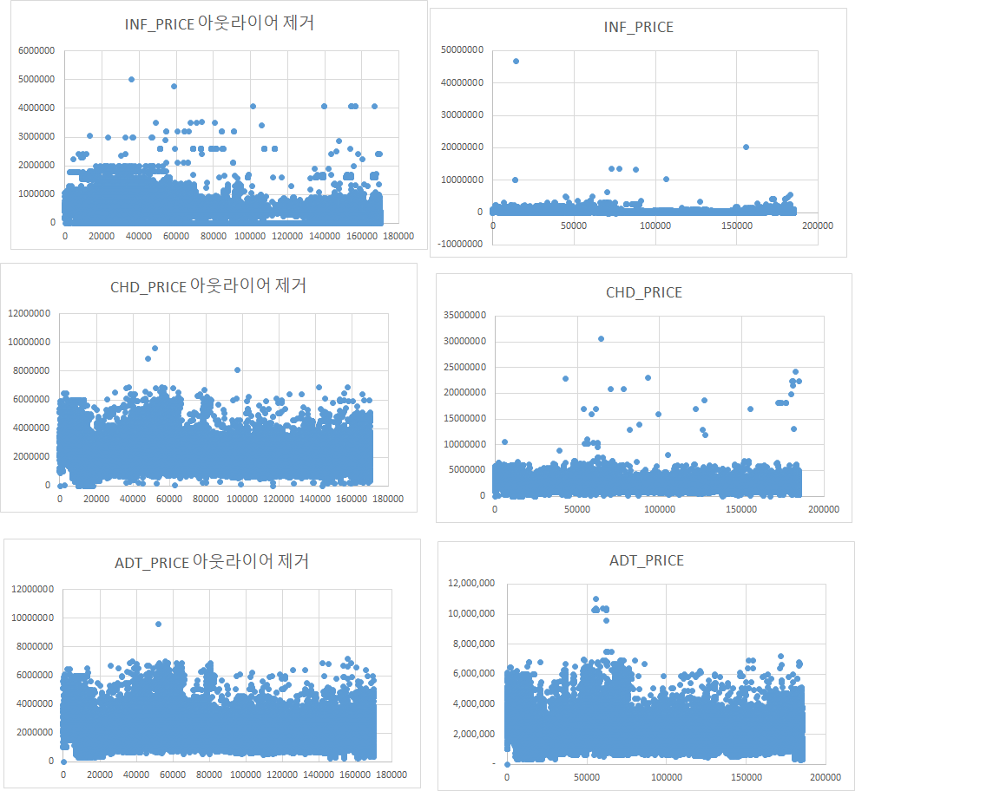

In [7]:
Image("TRAIN_OUTLIER.PNG")

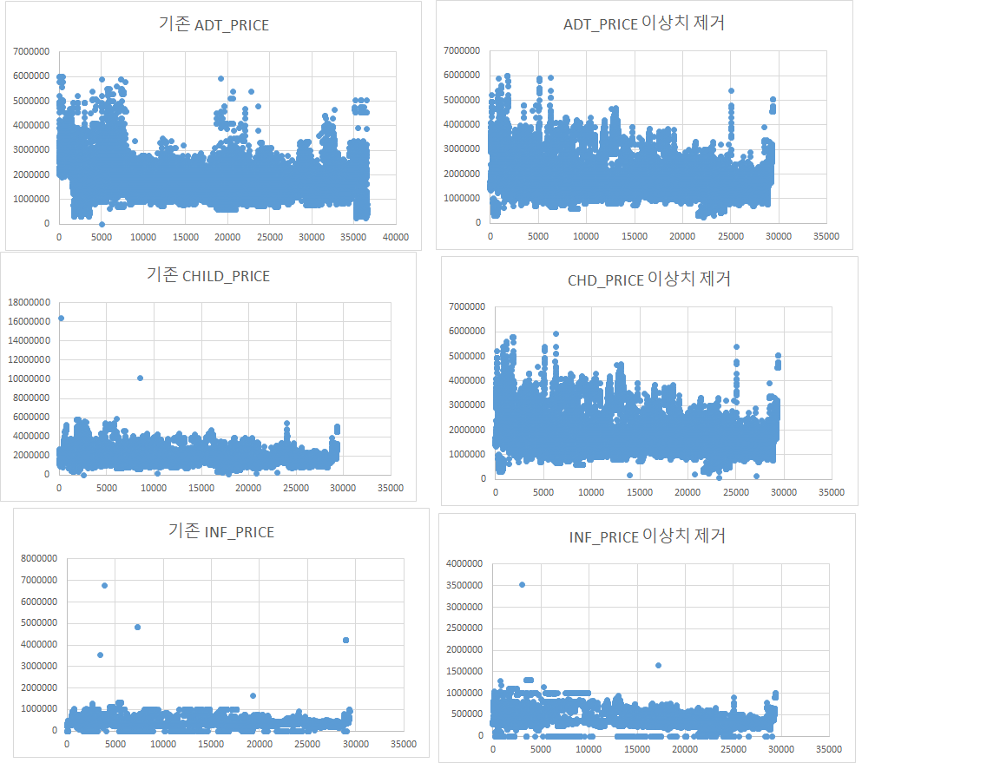

In [8]:
Image("TEST_OULIER.PNG")

- p1,p2,p3 가격 피쳐들의 아웃라이어들을 sql에서 제거하여 재추출
- 가격대 분포에서 이상치에 해당되는 것들을 눈으로 직접 확인 결과 가격대가 원래부터 높은 상품도 있음
- 이상치로 판단하고 제거한 데이터로는 상품가격이 직원들의 실수로 0이 하나더 붙은 상품이나 inf_price가 adt_price보다 높은 상품들 제거
- 이 상품들에 대한 평균값이 흐려지지 않기 위해 평균값 계산에서만 제거하는 것을 고려했지만 가격 평균과 가격 총합에서 제거가 되었는데 해당값들의 다른 정보들은 정상적으로 들어가 있지만 출발자수에 변동도 생길수 있기 때문에 결과값 예측에 방해될 요소가 있음으로 확실하게 오류데이터로 전체 정의내리고 삭제진행
- 대부분 제대로 들어가지 않은 상품들이거나 예약이 없는 상품들이므로 출발자수 약 40명정도의 차이로 데이터에 큰 영향이 없을것으로 최종 판단

In [9]:
train_outclear = pd.read_csv("train_outclear.csv", parse_dates=["datetime"])

In [10]:
train_outclear.head()

,datetime,tourday,b1,b2,b3,f1,f2,f3,f4,x1,...,ar24,ar25,ar26,ar27,ar28,ar29,art1,art2,art3,count
0,2015-01-01,9,2,12,101,3,456,30,0,0,...,0,0,0,0,0,0,53,0,62,321
1,2015-01-02,9,3,2,81,3,304,27,-1,0,...,2,0,0,0,0,0,44,0,42,271
2,2015-01-03,8,1,4,81,3,285,14,-1,0,...,0,0,0,0,0,0,39,0,47,315
3,2015-01-04,9,2,3,82,4,349,23,0,0,...,0,0,0,0,1,0,37,0,50,271
4,2015-01-05,10,4,5,54,3,202,20,0,1,...,0,0,0,0,0,0,39,0,24,109


In [11]:
test_outclear = pd.read_csv("test_outclear.csv", parse_dates=["datetime"])

In [12]:
test_outclear.head()

,datetime,tourday,b1,b2,b3,f1,f2,f3,f4,x1,...,ar23,ar24,ar25,ar26,ar27,ar28,ar29,art1,art2,art3
0,2019-01-01,9,7,1,84,4,418,13,0,0,...,0,0,0,0,0,0,0,48,1,43
1,2019-01-02,9,9,2,94,4,450,34,0,0,...,0,0,0,0,0,0,0,52,1,52
2,2019-01-03,9,9,2,83,3,316,13,0,0,...,0,0,0,0,0,0,0,52,1,41
3,2019-01-04,9,1,2,72,3,262,28,0,0,...,0,1,0,0,0,0,0,33,1,41
4,2019-01-05,9,6,0,68,3,222,15,0,0,...,0,0,0,0,0,0,0,35,1,38


In [13]:
train_outclear.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1461 entries, 0 to 1460
Data columns (total 59 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   datetime  1461 non-null   datetime64[ns]
 1   tourday   1461 non-null   int64         
 2   b1        1461 non-null   int64         
 3   b2        1461 non-null   int64         
 4   b3        1461 non-null   int64         
 5   f1        1461 non-null   int64         
 6   f2        1461 non-null   int64         
 7   f3        1461 non-null   int64         
 8   f4        1461 non-null   int64         
 9   x1        1461 non-null   int64         
 10  x2        1461 non-null   int64         
 11  n1        1461 non-null   int64         
 12  n2        1461 non-null   int64         
 13  p1        1461 non-null   int64         
 14  p2        1461 non-null   int64         
 15  p3        1461 non-null   int64         
 16  p4        1461 non-null   int64         
 17  p5        1461

In [14]:
test_outclear.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 58 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   datetime  365 non-null    datetime64[ns]
 1   tourday   365 non-null    int64         
 2   b1        365 non-null    int64         
 3   b2        365 non-null    int64         
 4   b3        365 non-null    int64         
 5   f1        365 non-null    int64         
 6   f2        365 non-null    int64         
 7   f3        365 non-null    int64         
 8   f4        365 non-null    int64         
 9   x1        365 non-null    int64         
 10  x2        365 non-null    int64         
 11  n1        365 non-null    int64         
 12  n2        365 non-null    int64         
 13  p1        365 non-null    int64         
 14  p2        365 non-null    int64         
 15  p3        365 non-null    int64         
 16  p4        365 non-null    int64         
 17  p5        365 no

In [15]:
##새로 탐색하는 데이터에 결측치가 있는지 없는지 체크
train_outclear.columns[train_outclear.isna().any()].tolist()

[]

In [16]:
##새로 탐색하는 데이터에 결측치가 있는지 없는지 체크
test_outclear.columns[test_outclear.isna().any()].tolist()

[]

In [17]:
## 데이터들의 분포 형태 확인
train_outclear.describe()

,tourday,b1,b2,b3,f1,f2,f3,f4,x1,x2,...,ar24,ar25,ar26,ar27,ar28,ar29,art1,art2,art3,count
count,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,...,1461.000000,1461.0,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000,1461.000000
mean,9.095825,6.488022,2.222450,107.645448,3.164956,429.110883,22.455852,-2.768652,0.106092,45.266940,...,0.441478,0.0,0.000684,0.232717,0.139630,0.077344,62.299110,0.394935,53.661875,262.425736
std,0.359399,3.361653,2.457126,24.413004,0.914587,145.315816,11.862581,6.276931,0.321124,48.491052,...,0.989066,0.0,0.026162,0.628586,0.346722,0.272306,18.144932,0.830548,11.538232,114.532520
min,8.000000,0.000000,0.000000,38.000000,1.000000,94.000000,9.000000,-65.000000,0.000000,-5.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,17.000000,0.000000,17.000000,12.000000
25%,9.000000,3.000000,0.000000,90.000000,3.000000,321.000000,18.000000,-2.000000,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,47.000000,0.000000,46.000000,180.000000
50%,9.000000,7.000000,1.000000,109.000000,3.000000,424.000000,21.000000,-1.000000,0.000000,32.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,62.000000,0.000000,54.000000,251.000000
75%,9.000000,9.000000,3.000000,126.000000,4.000000,526.000000,26.000000,0.000000,0.000000,66.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,76.000000,0.000000,62.000000,336.000000
max,10.000000,19.000000,15.000000,165.000000,6.000000,960.000000,412.000000,0.000000,2.000000,257.000000,...,6.000000,0.0,1.000000,4.000000,1.000000,2.000000,113.000000,4.000000,89.000000,1036.000000


In [18]:
test_outclear.describe()

,tourday,b1,b2,b3,f1,f2,f3,f4,x1,x2,...,ar23,ar24,ar25,ar26,ar27,ar28,ar29,art1,art2,art3
count,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,...,365.000000,365.000000,365.0,365.0,365.0,365.0,365.0,365.000000,365.000000,365.000000
mean,9.104110,8.084932,2.060274,70.328767,3.035616,293.712329,21.972603,-3.443836,0.389041,65.715068,...,0.134247,0.287671,0.0,0.0,0.0,0.0,0.0,39.008219,1.068493,40.397260
std,0.406147,3.476122,1.982529,19.987809,1.035811,125.747969,6.311016,6.142112,0.603916,44.821145,...,0.349340,0.453298,0.0,0.0,0.0,0.0,0.0,11.422334,0.769058,12.201535
min,8.000000,1.000000,0.000000,19.000000,0.000000,-10.000000,0.000000,-41.000000,0.000000,-4.000000,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,11.000000,0.000000,11.000000
25%,9.000000,5.000000,1.000000,57.000000,2.000000,209.000000,18.000000,-3.000000,0.000000,33.000000,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,31.000000,0.000000,33.000000
50%,9.000000,8.000000,2.000000,71.000000,3.000000,290.000000,22.000000,-1.000000,0.000000,65.000000,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,40.000000,1.000000,42.000000
75%,9.000000,10.000000,3.000000,84.000000,4.000000,379.000000,26.000000,0.000000,1.000000,91.000000,...,0.000000,1.000000,0.0,0.0,0.0,0.0,0.0,47.000000,2.000000,49.000000
max,10.000000,17.000000,11.000000,115.000000,5.000000,699.000000,43.000000,0.000000,3.000000,231.000000,...,2.000000,1.000000,0.0,0.0,0.0,0.0,0.0,71.000000,3.000000,72.000000


In [19]:
train_outclear.columns

Index(['datetime', 'tourday', 'b1', 'b2', 'b3', 'f1', 'f2', 'f3', 'f4', 'x1',
       'x2', 'n1', 'n2', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'up1', 'um1',
       'uc1', 's1', 's2', 'o1', 'o2', 'ar1', 'ar2', 'ar3', 'ar4', 'ar5', 'ar6',
       'ar7', 'ar8', 'ar9', 'ar10', 'ar11', 'ar12', 'ar13', 'ar14', 'ar15',
       'ar16', 'ar17', 'ar18', 'ar19', 'ar20', 'ar21', 'ar22', 'ar23', 'ar24',
       'ar25', 'ar26', 'ar27', 'ar28', 'ar29', 'art1', 'art2', 'art3',
       'count'],
      dtype='object')

In [20]:
test_outclear.columns

Index(['datetime', 'tourday', 'b1', 'b2', 'b3', 'f1', 'f2', 'f3', 'f4', 'x1',
       'x2', 'n1', 'n2', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'up1', 'um1',
       'uc1', 's1', 's2', 'o1', 'o2', 'ar1', 'ar2', 'ar3', 'ar4', 'ar5', 'ar6',
       'ar7', 'ar8', 'ar9', 'ar10', 'ar11', 'ar12', 'ar13', 'ar14', 'ar15',
       'ar16', 'ar17', 'ar18', 'ar19', 'ar20', 'ar21', 'ar22', 'ar23', 'ar24',
       'ar25', 'ar26', 'ar27', 'ar28', 'ar29', 'art1', 'art2', 'art3'],
      dtype='object')

count    1461.000000
mean      262.425736
std       114.532520
min        12.000000
25%       180.000000
50%       251.000000
75%       336.000000
max      1036.000000
Name: count, dtype: float64


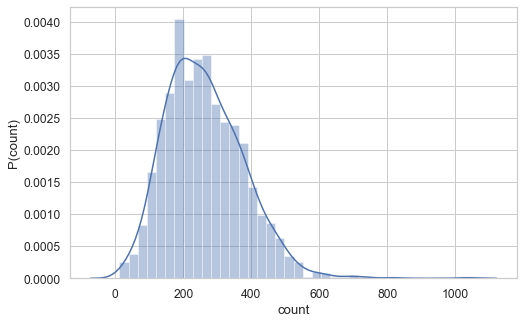

In [21]:
print(train_outclear['count'].describe())
sns.set(style='whitegrid', palette="deep", font_scale=1.1, rc={"figure.figsize": [8, 5]})
sns.distplot(
    train_outclear['count'], norm_hist=False, kde=True
).set(xlabel='count', ylabel='P(count)');

### 1.2 아웃라이어를 제거한 데이터들의 상관관계 재탐색

In [22]:
##피어슨 상관계수를 통한 상관관계 측정
train_outclear.corr(method = 'pearson')

,tourday,b1,b2,b3,f1,f2,f3,f4,x1,x2,...,ar24,ar25,ar26,ar27,ar28,ar29,art1,art2,art3,count
tourday,1.000000,0.087689,-0.159887,-0.302369,-0.106467,-0.238353,-0.026479,-0.037766,0.012743,-0.128255,...,-0.074775,NaN,-0.079825,0.161959,-0.206385,-0.110776,-0.266554,0.100295,-0.236303,-0.134524
b1,0.087689,1.000000,-0.133471,0.523027,-0.089916,0.357687,0.139363,-0.017527,-0.140630,-0.142105,...,-0.181028,NaN,-0.042740,0.123844,-0.161929,-0.205125,0.620295,0.214754,0.378636,0.186886
b2,-0.159887,-0.133471,1.000000,-0.026956,0.055590,0.077079,0.034774,-0.024700,0.062952,0.092714,...,0.135145,NaN,-0.002370,-0.029549,-0.110449,-0.152668,0.041752,-0.022941,0.053027,0.150091
b3,-0.302369,0.523027,-0.026956,1.000000,0.105632,0.739979,0.143332,0.018978,-0.113670,0.072067,...,-0.210117,NaN,-0.033936,-0.125574,0.025920,-0.045739,0.912887,0.000763,0.826826,0.383107
f1,-0.106467,-0.089916,0.055590,0.105632,1.000000,0.688675,0.182331,0.144274,-0.127259,-0.072700,...,-0.031344,NaN,-0.061972,-0.146643,0.052592,0.061495,0.102725,-0.152547,0.058577,-0.090958
f2,-0.238353,0.357687,0.077079,0.739979,0.688675,1.000000,0.243204,0.108012,-0.150803,-0.009248,...,-0.173110,NaN,-0.049924,-0.170857,0.024040,-0.026111,0.695850,-0.091209,0.598578,0.197772
f3,-0.026479,0.139363,0.034774,0.143332,0.182331,0.243204,1.000000,-0.015841,-0.045428,-0.024268,...,-0.031000,NaN,-0.016455,0.068800,-0.033804,-0.054390,0.119506,0.090720,0.156810,0.155893
f4,-0.037766,-0.017527,-0.024700,0.018978,0.144274,0.108012,-0.015841,1.000000,-0.080825,-0.079663,...,0.030646,NaN,-0.005136,-0.097327,0.061938,0.068066,0.006627,-0.085856,0.025546,-0.236729
x1,0.012743,-0.140630,0.062952,-0.113670,-0.127259,-0.150803,-0.045428,-0.080825,1.000000,0.707408,...,0.119839,NaN,-0.008649,-0.078285,-0.114684,-0.086070,-0.105367,-0.085299,-0.096235,0.006146
x2,-0.128255,-0.142105,0.092714,0.072067,-0.072700,-0.009248,-0.024268,-0.079663,0.707408,1.000000,...,0.140723,NaN,-0.012022,-0.132977,-0.144192,-0.130724,0.052399,-0.049286,0.051969,0.114159


### 1.3 각 변수들 간의 상관관계 시각화

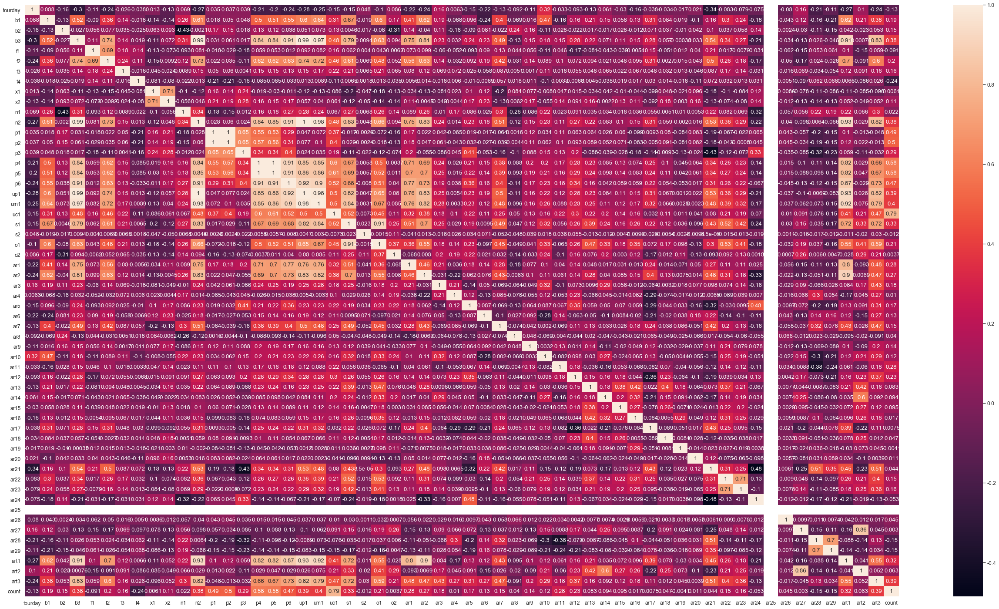

In [23]:
## 상관관계도를 시각화
transformed_corr_outclear = train_outclear.corr()
plt.figure(figsize=(45,25))
sns.heatmap(transformed_corr_outclear, annot=True)

### 위그래프 분석
- COUNT와 변수들 사이의 상관관계를 확인 양의 상관관계를 가지는 변수들로는 b1, b2, b3, f2, f3, x1, x2, n1, n2, p1, p2, p3, p4, p5, p6, up1
  um1, uc1,s1, o1, o2, ar1 ~ ar17, ar20, ar21, ar22, ar23, ar26, ar27, art1, art2, art3
- 이 그래프에서 확인할수 있는 사실은 각 독립변수들간의 상관관계에서 1을 나타내는 값들이 나타남 -> 다중공선성의 가능성
  sns.pairplot으로 확인하여 어떤 선형그래프를 그리고 있는지 확인하여 vif 지수 측정을 통해 하나씩 제거해나갈 예정

In [24]:
features_outclear = train_outclear.select_dtypes([np.number]).columns.tolist()

In [25]:
train_outclear[features_outclear]

,tourday,b1,b2,b3,f1,f2,f3,f4,x1,x2,...,ar24,ar25,ar26,ar27,ar28,ar29,art1,art2,art3,count
0,9,2,12,101,3,456,30,0,0,4,...,0,0,0,0,0,0,53,0,62,321
1,9,3,2,81,3,304,27,-1,0,65,...,2,0,0,0,0,0,44,0,42,271
2,8,1,4,81,3,285,14,-1,0,38,...,0,0,0,0,0,0,39,0,47,315
3,9,2,3,82,4,349,23,0,0,36,...,0,0,0,0,1,0,37,0,50,271
4,10,4,5,54,3,202,20,0,1,90,...,0,0,0,0,0,0,39,0,24,109
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,9,7,1,117,4,602,27,0,0,20,...,0,0,0,0,0,0,76,1,48,241
1457,9,3,2,99,3,396,22,0,0,36,...,0,0,0,0,0,0,42,1,61,273
1458,9,8,5,113,4,541,33,-1,0,19,...,0,0,0,0,0,0,73,1,52,381
1459,9,8,2,102,3,443,26,-2,0,30,...,0,0,0,0,1,0,54,1,57,250


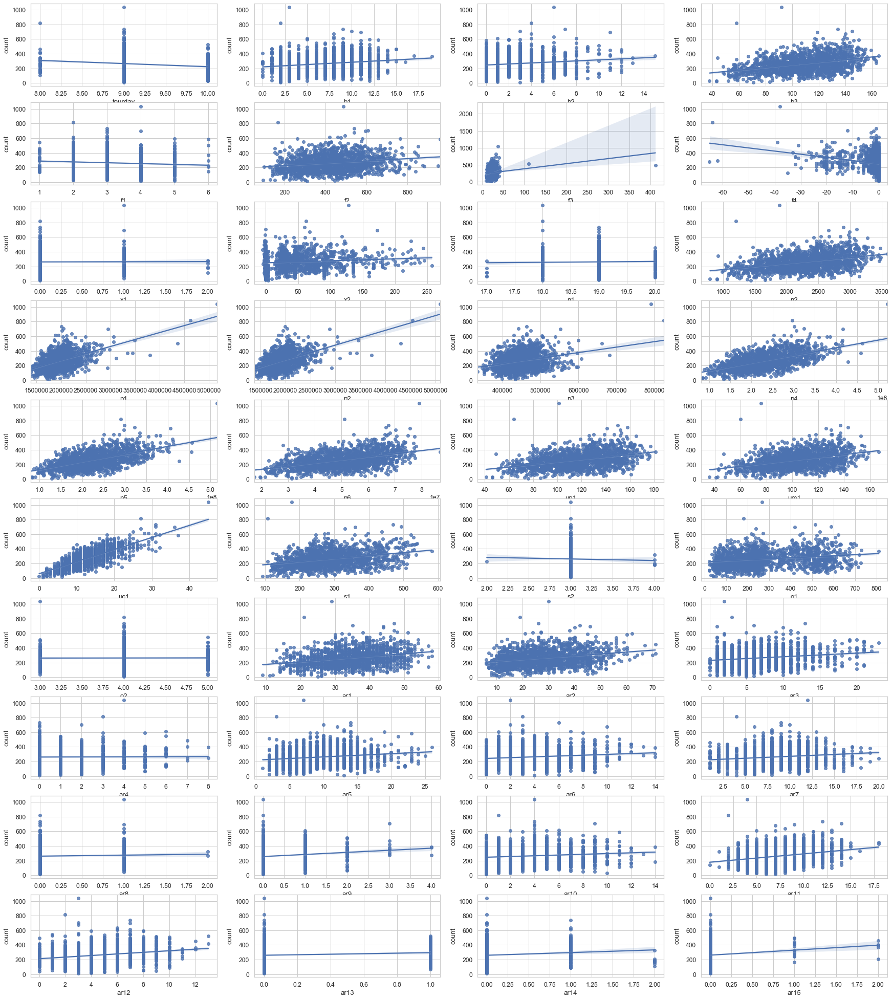

In [26]:
fig, ax = plt.subplots(10,4, figsize=(30,35))
for variable, subplot in zip(features_outclear, ax.flatten()):
    sns.regplot(x=train_outclear[variable], y=train_outclear['count'], ax=subplot)

### 위그래프 분석
- P 계열 변수값들의 아웃라이어들이 제거된걸 확인할수 있음 
- f3의 극단치의 경우 영업에서 설정한 fake_count가 의미없이 설정된 오류데이터가 아닌 의미가 있다고 판단하여 유지

In [27]:
num_col_outclear = train_outclear.select_dtypes(exclude=['object']).drop(['datetime','count'], axis=1).columns

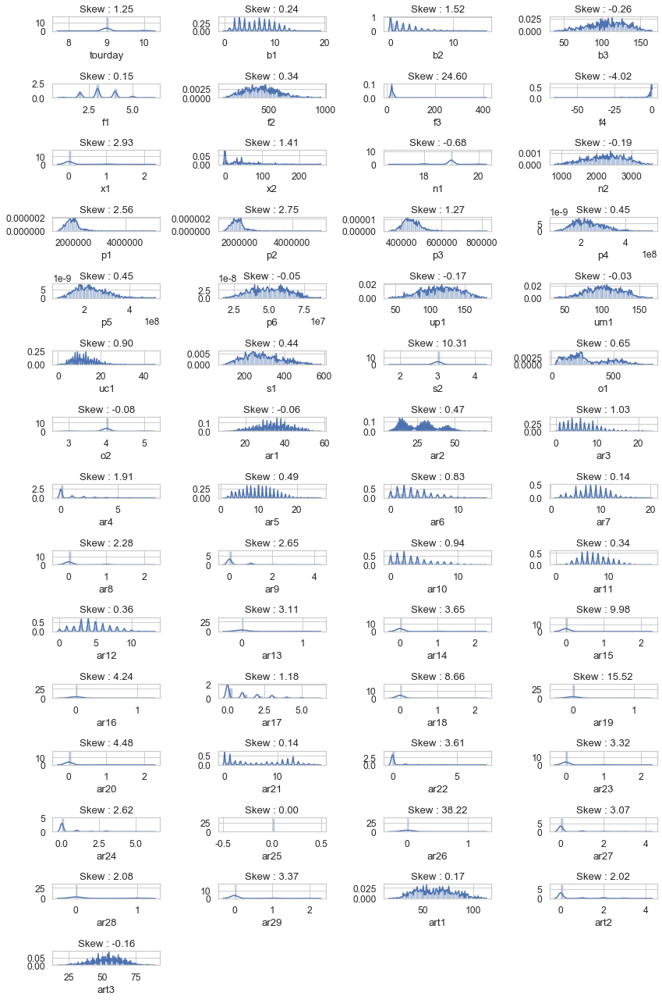

In [28]:
fig = plt.figure(figsize=(12,18))
for i in range(len(num_col_outclear)):
    fig.add_subplot(15,4,i+1)
    sns.distplot(train_outclear[num_col_outclear[i]], kde_kws={'bw': 0.1})
    plt.title('Skew : %.2f' % train_outclear[num_col_outclear[i]].skew())
    
plt.tight_layout()
plt.show()

### 위그래프 분석
- p계열 변수들의 왜도가 기존에는 왼쪽으로 치우쳐져 있었지만 현재 좀더 정규분포에 가까워짐

## 2. 정규화 진행
- 정규화의 경우 아웃라이어 영향을 많이 받기 때문에 의미있다고 생각되는 데이터를 제외하고 아웃라이어 즉각, 정규화 진행

In [29]:
## 트레인과 테스트 데이터를 복사하여 정규화 진행 예정
## 기존 원데이터를 사용하여 정규화 진행 후 진행 전 데이터를 비교하기 위해 데이터를 COPY하여 진행
X_train = train_outclear.copy()
X_test = test_outclear.copy()

In [30]:
X_train

,datetime,tourday,b1,b2,b3,f1,f2,f3,f4,x1,...,ar24,ar25,ar26,ar27,ar28,ar29,art1,art2,art3,count
0,2015-01-01,9,2,12,101,3,456,30,0,0,...,0,0,0,0,0,0,53,0,62,321
1,2015-01-02,9,3,2,81,3,304,27,-1,0,...,2,0,0,0,0,0,44,0,42,271
2,2015-01-03,8,1,4,81,3,285,14,-1,0,...,0,0,0,0,0,0,39,0,47,315
3,2015-01-04,9,2,3,82,4,349,23,0,0,...,0,0,0,0,1,0,37,0,50,271
4,2015-01-05,10,4,5,54,3,202,20,0,1,...,0,0,0,0,0,0,39,0,24,109
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,2018-12-27,9,7,1,117,4,602,27,0,0,...,0,0,0,0,0,0,76,1,48,241
1457,2018-12-28,9,3,2,99,3,396,22,0,0,...,0,0,0,0,0,0,42,1,61,273
1458,2018-12-29,9,8,5,113,4,541,33,-1,0,...,0,0,0,0,0,0,73,1,52,381
1459,2018-12-30,9,8,2,102,3,443,26,-2,0,...,0,0,0,0,1,0,54,1,57,250


In [31]:
## 정규화 진행 전 datetime과 count는 제외시키고 진행해야 되기 때문에 iloc으로 해당 위치 컬럼만 불러옴
X_train.iloc[:,1:-1]

,tourday,b1,b2,b3,f1,f2,f3,f4,x1,x2,...,ar23,ar24,ar25,ar26,ar27,ar28,ar29,art1,art2,art3
0,9,2,12,101,3,456,30,0,0,4,...,0,0,0,0,0,0,0,53,0,62
1,9,3,2,81,3,304,27,-1,0,65,...,0,2,0,0,0,0,0,44,0,42
2,8,1,4,81,3,285,14,-1,0,38,...,0,0,0,0,0,0,0,39,0,47
3,9,2,3,82,4,349,23,0,0,36,...,0,0,0,0,0,1,0,37,0,50
4,10,4,5,54,3,202,20,0,1,90,...,0,0,0,0,0,0,0,39,0,24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,9,7,1,117,4,602,27,0,0,20,...,0,0,0,0,0,0,0,76,1,48
1457,9,3,2,99,3,396,22,0,0,36,...,0,0,0,0,0,0,0,42,1,61
1458,9,8,5,113,4,541,33,-1,0,19,...,0,0,0,0,0,0,0,73,1,52
1459,9,8,2,102,3,443,26,-2,0,30,...,0,0,0,0,0,1,0,54,1,57


### 2.1 표준정규화 진행

In [32]:
scaler = StandardScaler()

In [33]:
## datetime과 count를 제외하고 해당 feature들만 정규화 하기위해 iloc을 사용
fit_train = scaler.fit_transform(X_train.iloc[:,1:-1])

In [34]:
## 정규화된 값들의 array
fit_train

array([[-0.26671651, -1.33552104,  3.98062512, ..., -0.51266625,
        -0.47567415,  0.72289928],
       [-0.26671651, -1.0379465 , -0.09056375, ..., -1.00884236,
        -0.47567415, -1.01106205],
       [-3.05009377, -1.63309557,  0.72367402, ..., -1.28449575,
        -0.47567415, -0.57757172],
       ...,
       [-0.26671651,  0.44992618,  1.13079291, ...,  0.58994732,
         0.72876248, -0.14408139],
       [-0.26671651,  0.44992618, -0.09056375, ..., -0.45753558,
         0.72876248,  0.28940895],
       [ 2.51666075,  1.04507525, -0.49768264, ..., -1.33962643,
        -0.47567415, -0.40417558]])

In [35]:
## 정규화된 array 값들을 기존의 데이터에서 정규화 데이터로 교체 진행
X_train.iloc[:,1:-1] = fit_train

In [36]:
## 정규화가 완료된 트레인 데이터
X_train.head()

,datetime,tourday,b1,b2,b3,f1,f2,f3,f4,x1,...,ar24,ar25,ar26,ar27,ar28,ar29,art1,art2,art3,count
0,2015-01-01,-0.266717,-1.335521,3.980625,-0.272303,-0.180422,0.185103,0.636180,0.441235,-0.330490,...,-0.446512,0.0,-0.026171,-0.37035,-0.402854,-0.284131,-0.512666,-0.475674,0.722899,321
1,2015-01-02,-0.266717,-1.037946,-0.090564,-1.091819,-0.180422,-0.861253,0.383197,0.281867,-0.330490,...,1.576291,0.0,-0.026171,-0.37035,-0.402854,-0.284131,-1.008842,-0.475674,-1.011062,271
2,2015-01-03,-3.050094,-1.633096,0.723674,-1.091819,-0.180422,-0.992048,-0.713061,0.281867,-0.330490,...,-0.446512,0.0,-0.026171,-0.37035,-0.402854,-0.284131,-1.284496,-0.475674,-0.577572,315
3,2015-01-04,-0.266717,-1.335521,0.316555,-1.050843,0.913342,-0.551477,0.045887,0.441235,-0.330490,...,-0.446512,0.0,-0.026171,-0.37035,2.482290,-0.284131,-1.394757,-0.475674,-0.317478,271
4,2015-01-05,2.516661,-0.740372,1.130793,-2.198165,-0.180422,-1.563413,-0.207096,0.441235,2.784642,...,-0.446512,0.0,-0.026171,-0.37035,-0.402854,-0.284131,-1.284496,-0.475674,-2.571627,109


In [37]:
## 테스터 데이터도 진행
X_test.iloc[:,1:]

,tourday,b1,b2,b3,f1,f2,f3,f4,x1,x2,...,ar23,ar24,ar25,ar26,ar27,ar28,ar29,art1,art2,art3
0,9,7,1,84,4,418,13,0,0,45,...,0,0,0,0,0,0,0,48,1,43
1,9,9,2,94,4,450,34,0,0,83,...,0,0,0,0,0,0,0,52,1,52
2,9,9,2,83,3,316,13,0,0,20,...,0,0,0,0,0,0,0,52,1,41
3,9,1,2,72,3,262,28,0,0,31,...,0,1,0,0,0,0,0,33,1,41
4,9,6,0,68,3,222,15,0,0,46,...,0,0,0,0,0,0,0,35,1,38
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
360,8,3,5,32,1,56,27,-4,0,38,...,0,1,0,0,0,0,0,21,0,19
361,8,5,1,22,0,-10,0,-8,0,-3,...,0,0,0,0,0,0,0,17,0,11
362,9,4,3,41,1,74,10,0,0,42,...,0,0,0,0,0,0,0,31,0,17
363,10,6,0,19,1,44,13,-15,1,31,...,0,0,0,0,0,0,0,11,0,14


In [38]:
fit_test = scaler.fit_transform(X_test.iloc[:,1:])

In [39]:
fit_test

array([[-0.25668645, -0.31253813, -0.53554281, ...,  0.78829106,
        -0.08918339,  0.21360529],
       [-0.25668645,  0.2636054 , -0.03044429, ...,  1.13896289,
        -0.08918339,  0.95222989],
       [-0.25668645,  0.2636054 , -0.03044429, ...,  1.13896289,
        -0.08918339,  0.04946649],
       ...,
       [-0.25668645, -1.17675343,  0.47465422, ..., -0.70206422,
        -1.39126095, -1.92019911],
       [ 2.20885449, -0.6006099 , -1.04064133, ..., -2.45542336,
        -1.39126095, -2.16640731],
       [-0.25668645, -0.88868167, -1.04064133, ..., -0.78973217,
        -1.39126095, -1.50985211]])

In [40]:
X_test.iloc[:,1:] = fit_test

In [41]:
X_test

,datetime,tourday,b1,b2,b3,f1,f2,f3,f4,x1,...,ar23,ar24,ar25,ar26,ar27,ar28,ar29,art1,art2,art3
0,2019-01-01,-0.256686,-0.312538,-0.535543,0.684917,0.932320,0.989744,-1.423688,0.561462,-0.645081,...,-0.384814,-0.635489,0.0,0.0,0.0,0.0,0.0,0.788291,-0.089183,0.213605
1,2019-01-02,-0.256686,0.263605,-0.030444,1.185909,0.932320,1.244570,1.908394,0.561462,-0.645081,...,-0.384814,-0.635489,0.0,0.0,0.0,0.0,0.0,1.138963,-0.089183,0.952230
2,2019-01-03,-0.256686,0.263605,-0.030444,0.634818,-0.034432,0.177484,-1.423688,0.561462,-0.645081,...,-0.384814,-0.635489,0.0,0.0,0.0,0.0,0.0,1.138963,-0.089183,0.049466
3,2019-01-04,-0.256686,-2.040969,-0.030444,0.083727,-0.034432,-0.252536,0.956371,0.561462,-0.645081,...,-0.384814,1.573592,0.0,0.0,0.0,0.0,0.0,-0.526728,-0.089183,0.049466
4,2019-01-05,-0.256686,-0.600610,-1.040641,-0.116669,-0.034432,-0.571069,-1.106347,0.561462,-0.645081,...,-0.384814,-0.635489,0.0,0.0,0.0,0.0,0.0,-0.351392,-0.089183,-0.196742
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
360,2019-12-27,-2.722227,-1.464825,1.484851,-1.920240,-1.967937,-1.892982,0.797700,-0.090674,-0.645081,...,-0.384814,1.573592,0.0,0.0,0.0,0.0,0.0,-1.578744,-1.391261,-1.756060
361,2019-12-28,-2.722227,-0.888682,-0.535543,-2.421231,-2.934690,-2.418562,-3.486406,-0.742809,-0.645081,...,-0.384814,-0.635489,0.0,0.0,0.0,0.0,0.0,-1.929416,-1.391261,-2.412616
362,2019-12-29,-0.256686,-1.176753,0.474654,-1.469347,-1.967937,-1.749642,-1.899700,0.561462,-0.645081,...,-0.384814,-0.635489,0.0,0.0,0.0,0.0,0.0,-0.702064,-1.391261,-1.920199
363,2019-12-30,2.208854,-0.600610,-1.040641,-2.571529,-1.967937,-1.988542,-1.423688,-1.884047,1.013050,...,-0.384814,-0.635489,0.0,0.0,0.0,0.0,0.0,-2.455423,-1.391261,-2.166407


### 2.2 MinMax 정규화 진행 

In [42]:
from sklearn.preprocessing import MinMaxScaler
minMaxScaler = MinMaxScaler()

In [43]:
MM_train = train_outclear.copy()
MM_test = test_outclear.copy()

In [44]:
MM_fit_train = scaler.fit_transform(MM_train.iloc[:,1:-1])

In [45]:
MM_fit_train

array([[-0.26671651, -1.33552104,  3.98062512, ..., -0.51266625,
        -0.47567415,  0.72289928],
       [-0.26671651, -1.0379465 , -0.09056375, ..., -1.00884236,
        -0.47567415, -1.01106205],
       [-3.05009377, -1.63309557,  0.72367402, ..., -1.28449575,
        -0.47567415, -0.57757172],
       ...,
       [-0.26671651,  0.44992618,  1.13079291, ...,  0.58994732,
         0.72876248, -0.14408139],
       [-0.26671651,  0.44992618, -0.09056375, ..., -0.45753558,
         0.72876248,  0.28940895],
       [ 2.51666075,  1.04507525, -0.49768264, ..., -1.33962643,
        -0.47567415, -0.40417558]])

In [46]:
## 정규화된 array 값들을 기존의 데이터에서 정규화 데이터로 교체 진행
MM_train.iloc[:,1:-1] = MM_fit_train

In [47]:
MM_train.head()

,datetime,tourday,b1,b2,b3,f1,f2,f3,f4,x1,...,ar24,ar25,ar26,ar27,ar28,ar29,art1,art2,art3,count
0,2015-01-01,-0.266717,-1.335521,3.980625,-0.272303,-0.180422,0.185103,0.636180,0.441235,-0.330490,...,-0.446512,0.0,-0.026171,-0.37035,-0.402854,-0.284131,-0.512666,-0.475674,0.722899,321
1,2015-01-02,-0.266717,-1.037946,-0.090564,-1.091819,-0.180422,-0.861253,0.383197,0.281867,-0.330490,...,1.576291,0.0,-0.026171,-0.37035,-0.402854,-0.284131,-1.008842,-0.475674,-1.011062,271
2,2015-01-03,-3.050094,-1.633096,0.723674,-1.091819,-0.180422,-0.992048,-0.713061,0.281867,-0.330490,...,-0.446512,0.0,-0.026171,-0.37035,-0.402854,-0.284131,-1.284496,-0.475674,-0.577572,315
3,2015-01-04,-0.266717,-1.335521,0.316555,-1.050843,0.913342,-0.551477,0.045887,0.441235,-0.330490,...,-0.446512,0.0,-0.026171,-0.37035,2.482290,-0.284131,-1.394757,-0.475674,-0.317478,271
4,2015-01-05,2.516661,-0.740372,1.130793,-2.198165,-0.180422,-1.563413,-0.207096,0.441235,2.784642,...,-0.446512,0.0,-0.026171,-0.37035,-0.402854,-0.284131,-1.284496,-0.475674,-2.571627,109


In [48]:
MM_fit_test = scaler.fit_transform(MM_test.iloc[:,1:])

In [49]:
MM_test.iloc[:,1:] = MM_fit_test

In [50]:
MM_test.head()

,datetime,tourday,b1,b2,b3,f1,f2,f3,f4,x1,...,ar23,ar24,ar25,ar26,ar27,ar28,ar29,art1,art2,art3
0,2019-01-01,-0.256686,-0.312538,-0.535543,0.684917,0.932320,0.989744,-1.423688,0.561462,-0.645081,...,-0.384814,-0.635489,0.0,0.0,0.0,0.0,0.0,0.788291,-0.089183,0.213605
1,2019-01-02,-0.256686,0.263605,-0.030444,1.185909,0.932320,1.244570,1.908394,0.561462,-0.645081,...,-0.384814,-0.635489,0.0,0.0,0.0,0.0,0.0,1.138963,-0.089183,0.952230
2,2019-01-03,-0.256686,0.263605,-0.030444,0.634818,-0.034432,0.177484,-1.423688,0.561462,-0.645081,...,-0.384814,-0.635489,0.0,0.0,0.0,0.0,0.0,1.138963,-0.089183,0.049466
3,2019-01-04,-0.256686,-2.040969,-0.030444,0.083727,-0.034432,-0.252536,0.956371,0.561462,-0.645081,...,-0.384814,1.573592,0.0,0.0,0.0,0.0,0.0,-0.526728,-0.089183,0.049466
4,2019-01-05,-0.256686,-0.600610,-1.040641,-0.116669,-0.034432,-0.571069,-1.106347,0.561462,-0.645081,...,-0.384814,-0.635489,0.0,0.0,0.0,0.0,0.0,-0.351392,-0.089183,-0.196742


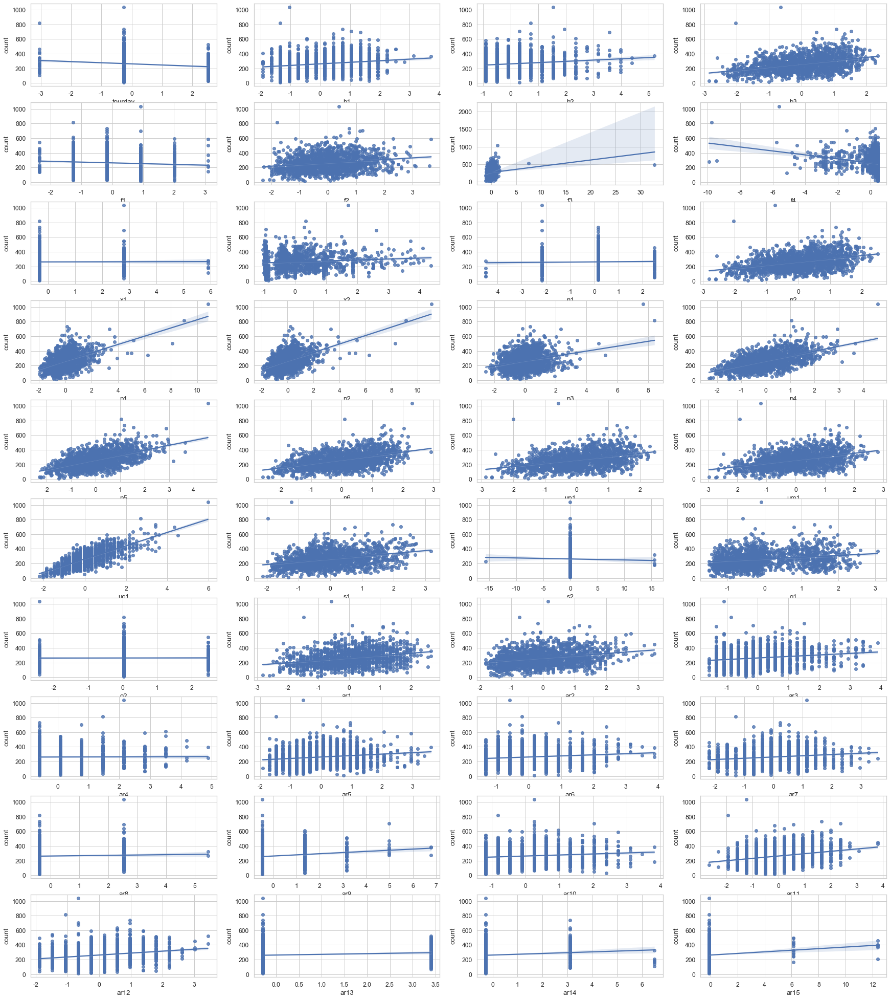

In [51]:
fig, ax = plt.subplots(10, 4, figsize=(30, 35))
for variable, subplot in zip(features_outclear, ax.flatten()):
    sns.regplot(x=X_train[variable], y=X_train['count'], ax=subplot)

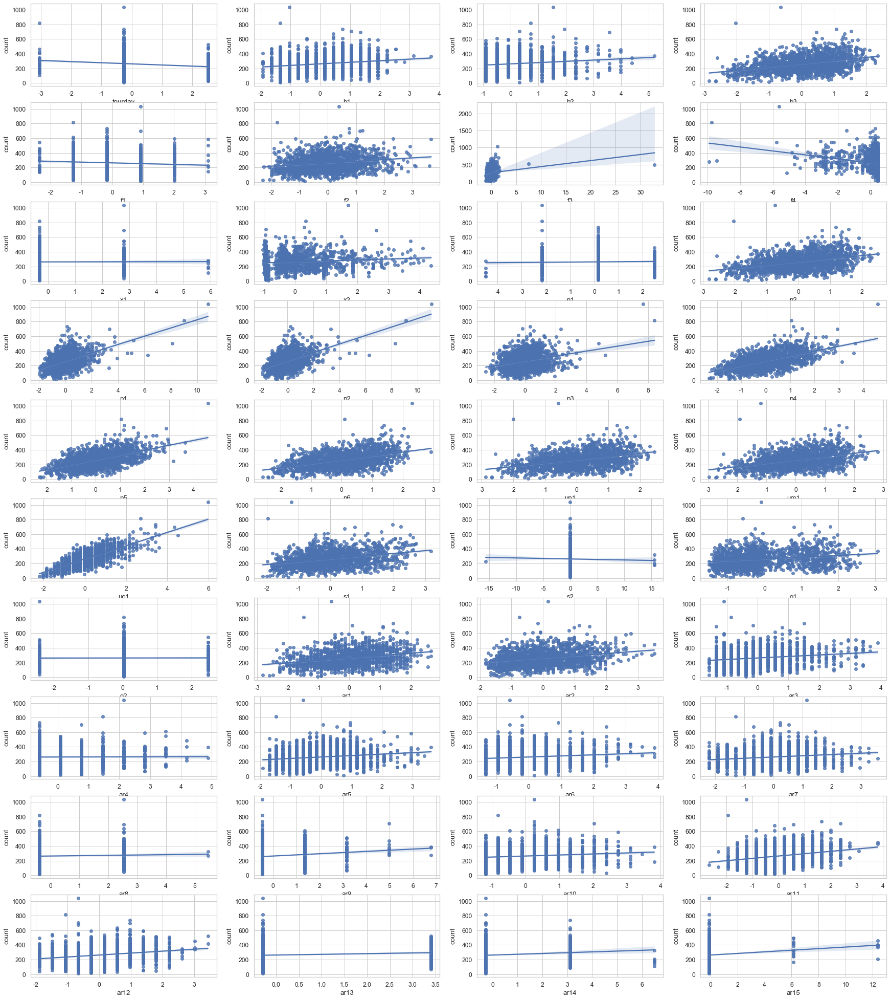

In [52]:
fig, ax = plt.subplots(10, 4, figsize=(30, 35))
for variable, subplot in zip(features_outclear, ax.flatten()):
    sns.regplot(x=MM_train[variable], y=MM_train['count'], ax=subplot)

### 위그래프 분석
- 표준정규화와 minmax정규화 두가지 방법을 모두 적용 결과 값은 차이가 거의 없는 것으로 보임
- 따라서, 둘중 하나의 정규화를 선택해서 진행하면 될 것으로 판단

In [53]:
X_train.head()

,datetime,tourday,b1,b2,b3,f1,f2,f3,f4,x1,...,ar24,ar25,ar26,ar27,ar28,ar29,art1,art2,art3,count
0,2015-01-01,-0.266717,-1.335521,3.980625,-0.272303,-0.180422,0.185103,0.636180,0.441235,-0.330490,...,-0.446512,0.0,-0.026171,-0.37035,-0.402854,-0.284131,-0.512666,-0.475674,0.722899,321
1,2015-01-02,-0.266717,-1.037946,-0.090564,-1.091819,-0.180422,-0.861253,0.383197,0.281867,-0.330490,...,1.576291,0.0,-0.026171,-0.37035,-0.402854,-0.284131,-1.008842,-0.475674,-1.011062,271
2,2015-01-03,-3.050094,-1.633096,0.723674,-1.091819,-0.180422,-0.992048,-0.713061,0.281867,-0.330490,...,-0.446512,0.0,-0.026171,-0.37035,-0.402854,-0.284131,-1.284496,-0.475674,-0.577572,315
3,2015-01-04,-0.266717,-1.335521,0.316555,-1.050843,0.913342,-0.551477,0.045887,0.441235,-0.330490,...,-0.446512,0.0,-0.026171,-0.37035,2.482290,-0.284131,-1.394757,-0.475674,-0.317478,271
4,2015-01-05,2.516661,-0.740372,1.130793,-2.198165,-0.180422,-1.563413,-0.207096,0.441235,2.784642,...,-0.446512,0.0,-0.026171,-0.37035,-0.402854,-0.284131,-1.284496,-0.475674,-2.571627,109


## 3. VIF 분석 및 P_VALUE 분석을 통한 다중공선성 변수 파악

In [54]:
from patsy import dmatrices
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

### 3.1 시계열 데이터 추가

- 시계열 분석에서 사용한 변수들도 추가하여 VIF 분석 진행

In [55]:
X_train['year']=X_train["datetime"].dt.year
X_train['month']=X_train["datetime"].dt.month
X_train['week']=X_train["datetime"].dt.week
X_train['day']=X_train["datetime"].dt.day

X_test["year"] = X_test["datetime"].dt.year
X_test["month"] = X_test["datetime"].dt.month
X_test['week']= X_test["datetime"].dt.week
X_test["day"] = X_test["datetime"].dt.day

In [56]:
X_train.head()

,datetime,tourday,b1,b2,b3,f1,f2,f3,f4,x1,...,ar28,ar29,art1,art2,art3,count,year,month,week,day
0,2015-01-01,-0.266717,-1.335521,3.980625,-0.272303,-0.180422,0.185103,0.636180,0.441235,-0.330490,...,-0.402854,-0.284131,-0.512666,-0.475674,0.722899,321,2015,1,1,1
1,2015-01-02,-0.266717,-1.037946,-0.090564,-1.091819,-0.180422,-0.861253,0.383197,0.281867,-0.330490,...,-0.402854,-0.284131,-1.008842,-0.475674,-1.011062,271,2015,1,1,2
2,2015-01-03,-3.050094,-1.633096,0.723674,-1.091819,-0.180422,-0.992048,-0.713061,0.281867,-0.330490,...,-0.402854,-0.284131,-1.284496,-0.475674,-0.577572,315,2015,1,1,3
3,2015-01-04,-0.266717,-1.335521,0.316555,-1.050843,0.913342,-0.551477,0.045887,0.441235,-0.330490,...,2.482290,-0.284131,-1.394757,-0.475674,-0.317478,271,2015,1,1,4
4,2015-01-05,2.516661,-0.740372,1.130793,-2.198165,-0.180422,-1.563413,-0.207096,0.441235,2.784642,...,-0.402854,-0.284131,-1.284496,-0.475674,-2.571627,109,2015,1,2,5


In [57]:
## 요일 추가
X_train["dayofweek"] = X_train["datetime"].dt.dayofweek
X_test["dayofweek"] = X_test["datetime"].dt.dayofweek

In [58]:
## 시즌 데이터 추가
def badToRight(month):
    if month in [12,1,2]:
        return 4 ## 겨울
    elif month in [3,4,5]:
        return 1 ## 봄
    elif month in [6,7,8]:
        return 2 ## 여름
    elif month in [9,10,11]:
        return 3 ## 가을

X_train['season'] = X_train.month.apply(badToRight)

In [59]:
X_train.head()

,datetime,tourday,b1,b2,b3,f1,f2,f3,f4,x1,...,art1,art2,art3,count,year,month,week,day,dayofweek,season
0,2015-01-01,-0.266717,-1.335521,3.980625,-0.272303,-0.180422,0.185103,0.636180,0.441235,-0.330490,...,-0.512666,-0.475674,0.722899,321,2015,1,1,1,3,4
1,2015-01-02,-0.266717,-1.037946,-0.090564,-1.091819,-0.180422,-0.861253,0.383197,0.281867,-0.330490,...,-1.008842,-0.475674,-1.011062,271,2015,1,1,2,4,4
2,2015-01-03,-3.050094,-1.633096,0.723674,-1.091819,-0.180422,-0.992048,-0.713061,0.281867,-0.330490,...,-1.284496,-0.475674,-0.577572,315,2015,1,1,3,5,4
3,2015-01-04,-0.266717,-1.335521,0.316555,-1.050843,0.913342,-0.551477,0.045887,0.441235,-0.330490,...,-1.394757,-0.475674,-0.317478,271,2015,1,1,4,6,4
4,2015-01-05,2.516661,-0.740372,1.130793,-2.198165,-0.180422,-1.563413,-0.207096,0.441235,2.784642,...,-1.284496,-0.475674,-2.571627,109,2015,1,2,5,0,4


In [60]:
def badToRight(month):
    if month in [12,1,2]:
        return 4
    elif month in [3,4,5]:
        return 1
    elif month in [6,7,8]:
        return 2
    elif month in [9,10,11]:
        return 3

X_test['season'] = X_test.month.apply(badToRight)

In [61]:
X_test.head()

,datetime,tourday,b1,b2,b3,f1,f2,f3,f4,x1,...,ar29,art1,art2,art3,year,month,week,day,dayofweek,season
0,2019-01-01,-0.256686,-0.312538,-0.535543,0.684917,0.932320,0.989744,-1.423688,0.561462,-0.645081,...,0.0,0.788291,-0.089183,0.213605,2019,1,1,1,1,4
1,2019-01-02,-0.256686,0.263605,-0.030444,1.185909,0.932320,1.244570,1.908394,0.561462,-0.645081,...,0.0,1.138963,-0.089183,0.952230,2019,1,1,2,2,4
2,2019-01-03,-0.256686,0.263605,-0.030444,0.634818,-0.034432,0.177484,-1.423688,0.561462,-0.645081,...,0.0,1.138963,-0.089183,0.049466,2019,1,1,3,3,4
3,2019-01-04,-0.256686,-2.040969,-0.030444,0.083727,-0.034432,-0.252536,0.956371,0.561462,-0.645081,...,0.0,-0.526728,-0.089183,0.049466,2019,1,1,4,4,4
4,2019-01-05,-0.256686,-0.600610,-1.040641,-0.116669,-0.034432,-0.571069,-1.106347,0.561462,-0.645081,...,0.0,-0.351392,-0.089183,-0.196742,2019,1,1,5,5,4


In [62]:
## VIF분석 및 P_Value 분석을 진행할 변수들 
features_1 = "tourday+b1+b2+b3+f1+f2+f3+f4+x1+x2+n1+n2+p1+p2+p3+p4+p5+p6+up1+um1+uc1+s1+s2+o1+o2+ar1+ar2+ar3+ar4+ar5+ar6+ar7+ar8+ar9+ar10+ar11+ar12+ar13+ar14+ar15+ar16+ar17+ar18+ar19+ar20+ar21+ar22+ar23+ar24+ar25+ar26+ar27+ar28+ar29+art1+art2+art3+year+month+week+day+season+dayofweek"

### 3.2 P_VALUE

In [63]:
y, X = dmatrices("count ~" + features_1, data=X_train, return_type="dataframe")

vif = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

result = sm.OLS(y, X).fit()

In [64]:
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                  count   R-squared:                       0.815
Model:                            OLS   Adj. R-squared:                  0.808
Method:                 Least Squares   F-statistic:                     108.6
Date:                Thu, 16 Jul 2020   Prob (F-statistic):               0.00
Time:                        15:07:19   Log-Likelihood:                -7765.3
No. Observations:                1461   AIC:                         1.565e+04
Df Residuals:                    1403   BIC:                         1.595e+04
Df Model:                          57                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.035e+04   9793.565      1.057      0.2

### 위 데이터 분석
- R-squared값이 0.808로 나와있는 것을 확인 할 수 있음 이는 회귀모형의 설명력이 80.5%라는 뜻
- intercept(절편)의 결과를 확인해보면 t값은 1.057, P>ltl값은 0.291로 30%하에서 유의한 것으로 나타났으며
  그 값은 10,350로 나타남

### 3.3 VIF 분석

- 분석 순서
    - 1. VIF 계수가 높은 feature제거
 
    - 2. 단 유사한 feature의 경우, 둘 중 1개만 제거(FIP, kFIP의 경우)

    - 3. 제거 후 VIF계수 재출력

    - 4. (1, 2, 3)의 과정 반복

    - 5. 회귀분석 진행

    - 6. feature의 p-value점검

In [65]:
vif = pd.DataFrame()

In [66]:
vif["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

In [67]:
vif["features_1"] = X.columns

In [68]:
vif.round(1).iloc[5:]

,VIF Factor,features_1
5,7.6,f1
6,17.6,f2
7,1.1,f3
8,1.2,f4
9,2.5,x1
10,3.3,x2
11,3.1,n1
12,984.5,n2
13,4556.2,p1
14,4615.2,p2


### 위 VIF 분석
- 다수의 변수들이 VIF 계수가 높게 나온것을 확인 가능
- 데이터간의 관계도와 상관계수 그래프를 통해 다중공선성의 문제가 생기는 데이터를 확인 후 제거할 예정

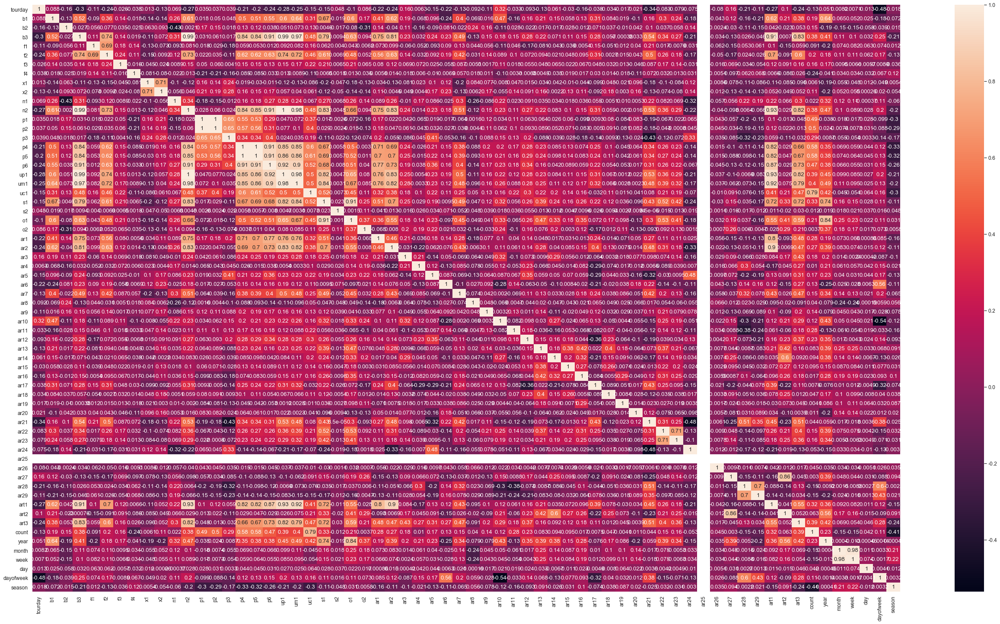

In [69]:
## 상관관계도를 시각화
transformed_corr_x = X_train.corr()
plt.figure(figsize=(45,25))
sns.heatmap(transformed_corr_x, annot=True)

### 위그래프 분석
- 서로 다른 변수간에 상관계수가 1이 나오는 항목들이 있음 둘중 하나를 제거 해줘야함
- (P4,P5), (P1,P2), (MONTH,WEEK) 둘중 하나를 확실히 제거해야 할 항목들 
- 각 변수들 중 Count와 상관관계가 가장 높은 변수를 남겨둠

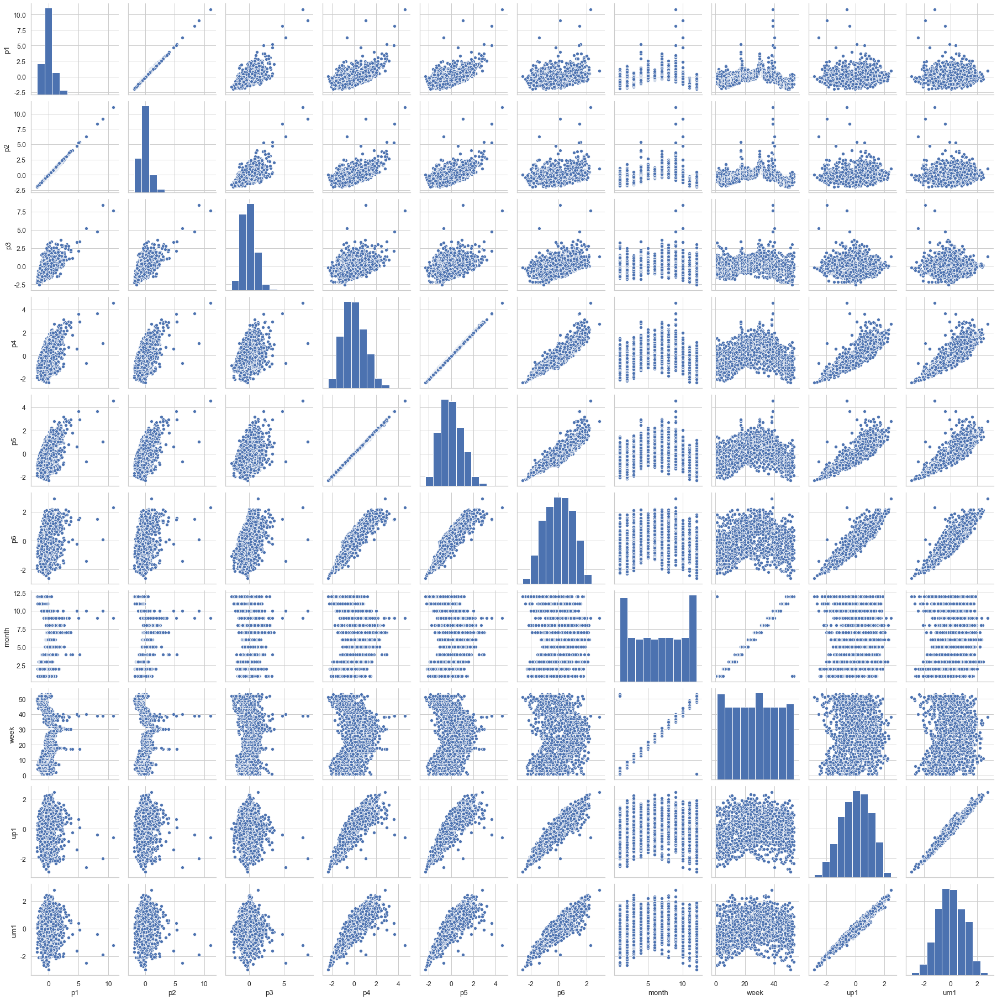

In [70]:
sns.pairplot(X_train[['p1','p2','p3','p4','p5','p6','month','week','up1','um1']])

In [71]:
X_train[['p1','p2','count']].corr(method='pearson')

,p1,p2,count
p1,1.000000,0.996620,0.490146
p2,0.996620,1.000000,0.503864
count,0.490146,0.503864,1.000000


- p2가 count와 상관계수가 더 높음 p1 제외

In [72]:
X_train[['p4','p5','count']].corr(method='pearson')

,p4,p5,count
p4,1.000000,0.999168,0.583336
p5,0.999168,1.000000,0.581668
count,0.583336,0.581668,1.000000


- 근소한 차이로 p4가 p5보다 상관계수가 더 높은 것으로 나타남

In [73]:
X_train[['month','week','count']].corr(method='pearson')

,month,week,count
month,1.000000,0.977260,-0.146204
week,0.977260,1.000000,-0.152818
count,-0.146204,-0.152818,1.000000


- 둘다 count와 상관관계가 높진 않으나 month가 week보다 더 높은 것으로 나타남

In [74]:
X_train[['up1','um1','n2','count']].corr(method='pearson')

,up1,um1,n2,count
up1,1.000000,0.984159,0.997155,0.392947
um1,0.984159,1.000000,0.978179,0.395540
n2,0.997155,0.978179,1.000000,0.379038
count,0.392947,0.395540,0.379038,1.000000


- UP1, UM1 두개의 상관관계가 높고 UM1의 VIF 지수가 높게 나왔지만 UP1으로 인해 높아진건지 정확히 알 수 없음으로 추후 알아볼 예정

In [75]:
features_2 = "tourday+b1+b2+b3+f1+f2+f3+f4+x1+x2+n1+n2+p2+p3+p4+p6+up1+um1+uc1+s1+s2+o1+o2+ar1+ar2+ar3+ar4+ar5+ar6+ar7+ar8+ar9+ar10+ar11+ar12+ar13+ar14+ar15+ar16+ar17+ar18+ar19+ar20+ar21+ar22+ar23+ar24+ar26+ar27+ar28+ar29+art1+art2+art3+year+month+week+day+season+dayofweek"

- 데이터가 다 0값이라서 상관관계가 나오지 않는 ar25 데이터 제거 
- p1, p5, week, ar25 제외

In [76]:
y, X = dmatrices("count ~" + features_2, data=X_train, return_type="dataframe")

vif_3 = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

result_3 = sm.OLS(y, X).fit()

In [77]:
print(result_3.summary())

                            OLS Regression Results                            
Dep. Variable:                  count   R-squared:                       0.811
Model:                            OLS   Adj. R-squared:                  0.804
Method:                 Least Squares   F-statistic:                     109.9
Date:                Thu, 16 Jul 2020   Prob (F-statistic):               0.00
Time:                        15:07:46   Log-Likelihood:                -7780.2
No. Observations:                1461   AIC:                         1.567e+04
Df Residuals:                    1405   BIC:                         1.597e+04
Df Model:                          55                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   3171.0240   9227.641      0.344      0.7

In [78]:
vif_3 = pd.DataFrame()

In [79]:
vif_3["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

In [80]:
vif_3["features_2"] = X.columns

In [81]:
vif_3.round(1).iloc[5:]

,VIF Factor,features_2
5,7.5,f1
6,17.4,f2
7,1.1,f3
8,1.2,f4
9,2.5,x1
10,3.2,x2
11,3.0,n1
12,982.6,n2
13,39.5,p2
14,30.6,p3


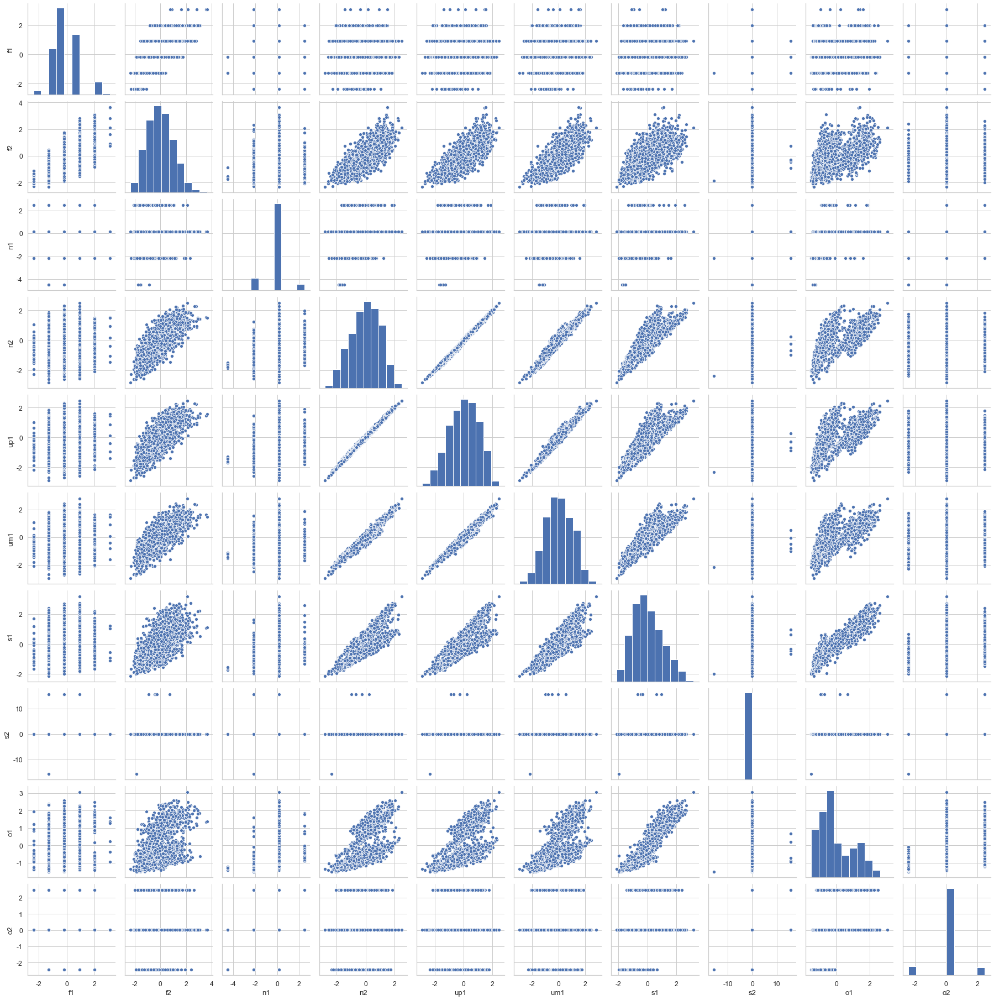

In [82]:
sns.pairplot(X_train[['f1','f2','n1','n2','up1','um1','s1','s2','o1','o2']])

In [83]:
features_3 = "tourday+b1+b2+b3+f1+f2+f3+f4+x1+x2+n1+p2+p3+p4+p6+up1+um1+uc1+s1+s2+o1+o2+ar1+ar2+ar3+ar4+ar5+ar6+ar7+ar8+ar9+ar10+ar11+ar12+ar13+ar14+ar15+ar16+ar17+ar18+ar19+ar20+ar21+ar22+ar23+ar24+ar26+ar27+ar28+ar29+art1+art2+art3+year+month+day+season+dayofweek"

In [84]:
y, X = dmatrices("count ~" + features_3, data=X_train, return_type="dataframe")

vif_4 = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

result_4 = sm.OLS(y, X).fit()

In [85]:
print(result_4.summary())

                            OLS Regression Results                            
Dep. Variable:                  count   R-squared:                       0.811
Model:                            OLS   Adj. R-squared:                  0.804
Method:                 Least Squares   F-statistic:                     114.2
Date:                Thu, 16 Jul 2020   Prob (F-statistic):               0.00
Time:                        15:08:02   Log-Likelihood:                -7780.4
No. Observations:                1461   AIC:                         1.567e+04
Df Residuals:                    1407   BIC:                         1.595e+04
Df Model:                          53                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   3308.2940   9194.395      0.360      0.7

In [86]:
vif_4 = pd.DataFrame()

In [87]:
vif_4["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

In [88]:
vif_4["features_3"] = X.columns

In [89]:
vif_4.round(1)

,VIF Factor,features_3
0,48113322.2,Intercept
1,1.9,tourday
2,inf,b1
3,inf,b2
4,inf,b3
5,7.5,f1
6,17.4,f2
7,1.1,f3
8,1.2,f4
9,2.5,x1


- VIF 지수가 높아 다중공선성의 문제가 있다고 해서 굳이 다 제외 시킬 필요는 없음
- 다중공선성의 문제가 있는 변수들을 추가하면 유의미한 결과를 뽑는데 전혀 도움이 안되고 연산만 길어 질 수 도 있지만
  직접 돌려보지 않는 이상 어떠한 영향을 끼칠지 모르기 때문에 여러가지 시도를 해야될것으로 사료됨
- 일단 다중공선성 수치가 너무 높은 것만 제외시키고 진행해볼 예정 순차적으로 마지막 정확도를 보고 지속적으로 추가 및 제외를 할 예정

In [90]:
features_last = "f2+f3+x1+x2+n1+p2+p3+uc1+s1+o1+o2++year+month+day+season+dayofweek+um1"

In [91]:
y, X = dmatrices("count ~" + features_last, data=X_train, return_type="dataframe")

vif_last = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

result_last = sm.OLS(y, X).fit()

In [92]:
print(result_last.summary())

                            OLS Regression Results                            
Dep. Variable:                  count   R-squared:                       0.775
Model:                            OLS   Adj. R-squared:                  0.772
Method:                 Least Squares   F-statistic:                     291.7
Date:                Thu, 16 Jul 2020   Prob (F-statistic):               0.00
Time:                        15:08:02   Log-Likelihood:                -7910.7
No. Observations:                1461   AIC:                         1.586e+04
Df Residuals:                    1443   BIC:                         1.595e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   5.219e+04   6896.605      7.567      0.0

In [93]:
vif_last = pd.DataFrame()

In [94]:
vif_last

""


In [95]:
vif_last["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

In [96]:
vif_last["features_last"] = X.columns

In [97]:
vif_last.round(1)

,VIF Factor,features_last
0,23226903.7,Intercept
1,3.2,f2
2,1.1,f3
3,2.2,x1
4,2.4,x2
5,1.3,n1
6,2.3,p2
7,2.2,p3
8,2.1,uc1
9,16.4,s1


##  시계열 분석 진행
- label과 시계열 변수들간의 관계 파악

[Text(0, 0.5, 'Count'), Text(0.5, 1.0, 'Month tour amount')]

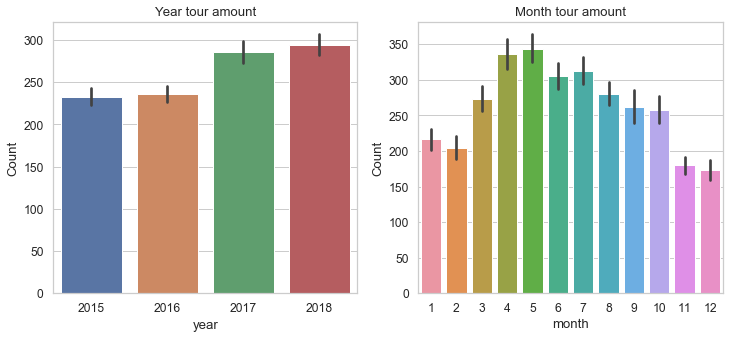

In [98]:
## 년도별, 월별 카운트수 시각화
figure, ((ax1,ax2)) = plt.subplots(nrows=1,ncols=2)
figure.set_size_inches(12,5)
sns.barplot(data= X_train, x="year", y="count", ax=ax1)
sns.barplot(data=X_train, x="month", y="count", ax=ax2)
ax1.set(ylabel='Count', title ="Year tour amount")
ax2.set(ylabel='Count', title ="Month tour amount")

### 위그래프 분석
- 2015년부터 2018년까지 꾸준히 증가하고 있는 추세를 보여주고 있음
- 주로 여행자들이 가장 집중되는 월로는 3~10월 사이가 가장 많은 것을 확인 할 수 있음
- 또한, 가장 많이 집중되는 월에서도 4, 5월달에 여행자가 가장 많은 것으로 나타남
- 2015년부터 2018년까지 전체 count를 통해 나온 패턴으로 여기서 다른 시각으로 각 년도별로 봣을때 어떠한 변화가 있을지 체크해볼 필요가 있음

In [99]:
# 월별 데이터 모아보기
def concatenate_year_month(datetime):
    return "{0}-{1}".format(datetime.year, datetime.month)
X_train["year_month"] = X_train["datetime"].apply(concatenate_year_month)
print(X_train.shape)
X_train[["datetime", "year_month"]].head()

(1461, 66)


,datetime,year_month
0,2015-01-01,2015-1
1,2015-01-02,2015-1
2,2015-01-03,2015-1
3,2015-01-04,2015-1
4,2015-01-05,2015-1


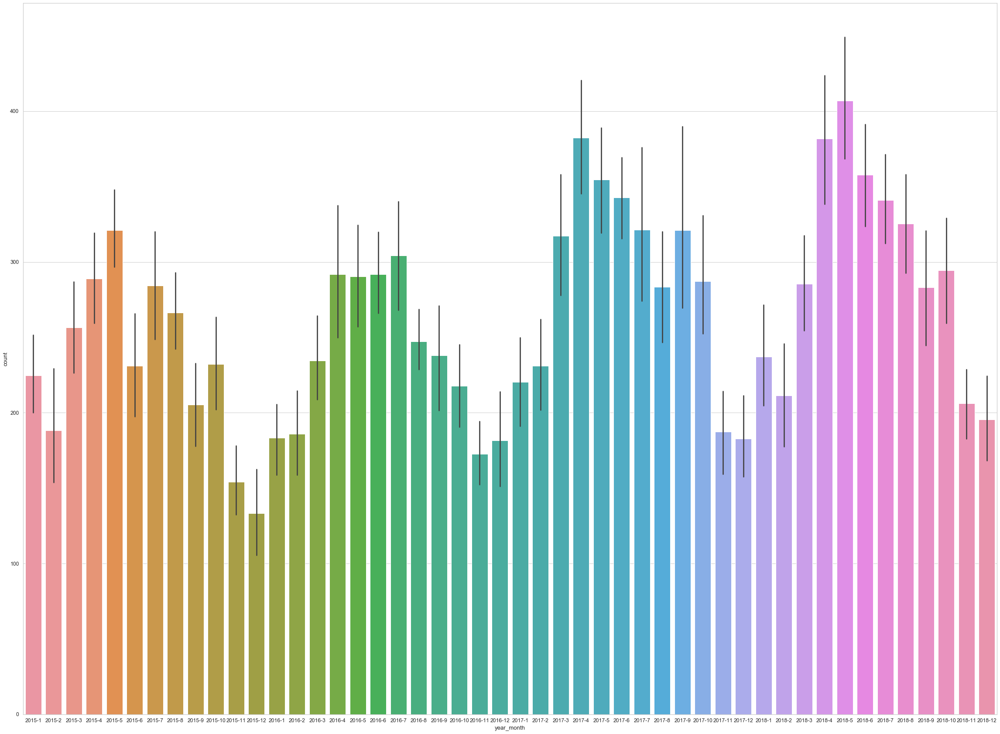

In [100]:
fig, ax1 = plt.subplots(nrows=1, ncols=1)
fig.set_size_inches(40,30)

sns.barplot(data=X_train, x="year_month",y="count",ax=ax1)

### 위그래프 분석
- 2015년에는 5월달에 여행자가 가장 많았는데 원인으로는 어린이날, 석가탄신일과 주말이 겹쳐 황금연휴를 이루고 있어 5월에 가장 많았던것으로 판단
- 2017년에는 4월말 주말과 근로자날, 석가탄신일등이 겹쳐 4월달에 출발을 많이 한것으로 판단, 또한 5월에는 어린이날과 주말이 겹쳐 황금연휴가 형성되어 여행자들이 많이 몰린것으로 판단됨
- 2018년에도 2017년과 마찬가지로 근로자의날과 어린이날 및 대체휴일로 인해 황금연휴가 형성되어 여행자들이 해당월에 많이 몰린것으로 판단
- 해가 거듭할수록 성수기와 비수기가 점점 뚜렷해지고 있다는 것을 볼 수 있었다
- 또한, 점점 여행에 대한 관심이 증가하여 시간과 기회만 생긴다면 해외여행을 나가는 비중이 점점 높아지고 있고 여름 휴가라고 해서 꼭 여름에 가는것이 아닌 황금연휴가 많은 봄에 주로 여행객들이 많은 것을 확인 할 수 있음
- 전체적으로 변함없이 봄과 여름에 여행객이 가장 많은 것으로 나타남
- 또한 3,4,5,6월의 경우 황금연휴를 피하기만 하면 패키지 가격이 저렴, 주로 많이 방문하는 일본, 유럽, 동남아(건기->우기)로 날씨가 좋음,
  여름휴가기간을 피해 적인 인파속에서 여행이 가능하기 때문에 이기간에 많이 찾는 것으로 예상

[Text(0, 0.5, 'Count'), Text(0.5, 1.0, 'dayofweek tour amount')]

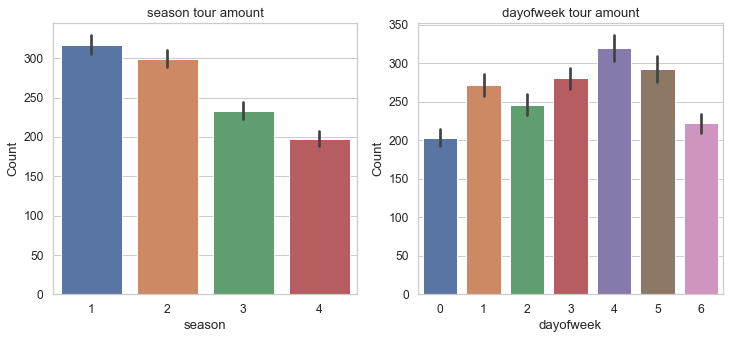

In [174]:
## 시즌별, 요일별 여행자 카운트수 시각화
figure, ((ax1,ax2)) = plt.subplots(nrows=1,ncols=2)
figure.set_size_inches(12,5)
sns.barplot(data=X_train, x="season", y="count", ax=ax1)
sns.barplot(data=X_train, x="dayofweek", y="count", ax=ax2)
ax1.set(ylabel='Count', title ="season tour amount")
ax2.set(ylabel='Count', title ="dayofweek tour amount")

### 위그래프 분석
- 1 : 봄 2: 여름 3: 가을 4 : 겨울
- 주로 봄, 여름에 여행을 가장 많이 가는 것을 확인 할 수 있음
- 0 : 월, 1: 화, 2: 수, 3: 목, 4: 금, 5: 토, 6: 일
- 목,금,토에 여행을 가장 많이가고 해외여행 특성상 1박2일 여행은 없고 최소 2박 3일 여행이기 때문에
  금요일에 여행을 출발하는 경우 많은 것으로 분석됨

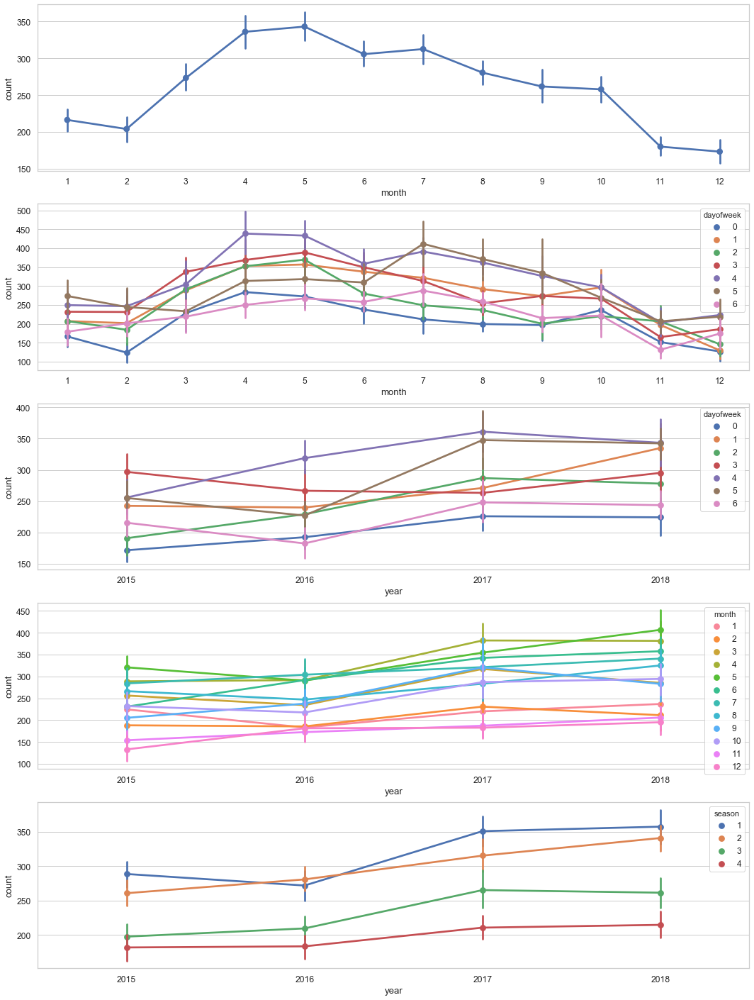

In [198]:
fig,(ax1,ax2, ax3, ax4, ax5)= plt.subplots(nrows=5)
fig.set_size_inches(18,25)

sns.pointplot(data=X_train, x="month", y="count", ax=ax1)

sns.pointplot(data=X_train, x="month", y="count", hue="dayofweek", ax=ax2)

sns.pointplot(data=X_train, x="year", y="count", hue="dayofweek", ax=ax3)

sns.pointplot(data=X_train, x="year", y="count", hue="month", ax=ax4)

sns.pointplot(data=X_train, x="year", y="count", hue="season", ax=ax5)

### 위그래프 분석
- 월별, 요일별 출발자수 그래프
    - 대체적으로 월요일에는 여행을 가지 않는 편이고 황금연휴 및 휴일이 많은 3,4,5,6월의 경우에는 화,수,목,금에
      여행을 가는 고객이 가장 많고 연휴가 별로없는 6월 이후 하반기에는 금,토에 주로 여행을 가는 경향이 있는 것으로 보인다
- 년도별, 요일별 출발자수 그래프
    - 2015년에는 목요일에 출발하는 고객들이 많았지만 해를 거듭할 수록 점점 금요일, 토요일에 출발하는 고객이 증가하는 추세
      -> 짧게 여행을 가더라도 해외로 나가는 고객이 많아지고 있다고 조심스럽게 예상
    - 또한 화요일에 여행가는 고객들이 급상승
- 년도별, 월별 출발자수 그래프
    - 2016년부터 3,4,5,6,7,8월에 고객들이 여행을 가장 많이 가는 것을 눈에 보기 쉽게 확인 가능
    - 또한 3,4,5,6월의 경우 황금연휴를 피하기만 하면 패키지 가격이 저렴, 주로 많이 방문하는 일본, 유럽, 동남아(건기->우기)로 날씨가 좋음,
      여름휴가기간을 피해 적인 인파속에서 여행이 가능하기 때문에 이기간에 많이 찾는 것으로 예상
- 년도별, 시즌별 출발자수 그래프
    - 2016년을 제외하고 대체적으로 3,4,5월 봄에 여행을 가는 고객이 가장 많고 그다음으로 6,7,8 여름에 여행을 많이 가는것으로 나타남

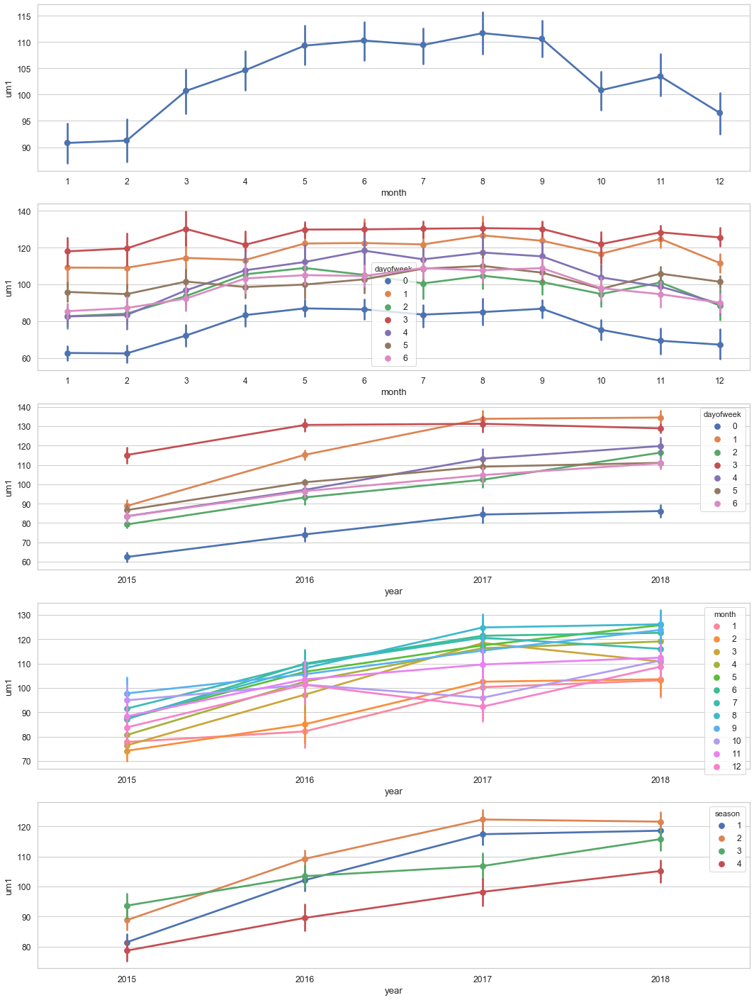

In [197]:
fig,(ax1,ax2, ax3, ax4, ax5)= plt.subplots(nrows=5)
fig.set_size_inches(18,25)

sns.pointplot(data=D_train, x="month", y="um1", ax=ax1)

sns.pointplot(data=D_train, x="month", y="um1", hue="dayofweek", ax=ax2)

sns.pointplot(data=D_train, x="year", y="um1", hue="dayofweek", ax=ax3)

sns.pointplot(data=D_train, x="year", y="um1", hue="month", ax=ax4)

sns.pointplot(data=D_train, x="year", y="um1", hue="season", ax=ax5)

In [209]:
relation_train = X_train.copy()

In [210]:
relation_train.head()

,datetime,tourday,b1,b2,b3,f1,f2,f3,f4,x1,...,art2,art3,count,year,month,week,day,dayofweek,season,year_month
0,2015-01-01,-0.266717,-1.335521,3.980625,-0.272303,-0.180422,0.185103,0.636180,0.441235,-0.330490,...,-0.475674,0.722899,321,2015,1,1,1,3,4,2015-1
1,2015-01-02,-0.266717,-1.037946,-0.090564,-1.091819,-0.180422,-0.861253,0.383197,0.281867,-0.330490,...,-0.475674,-1.011062,271,2015,1,1,2,4,4,2015-1
2,2015-01-03,-3.050094,-1.633096,0.723674,-1.091819,-0.180422,-0.992048,-0.713061,0.281867,-0.330490,...,-0.475674,-0.577572,315,2015,1,1,3,5,4,2015-1
3,2015-01-04,-0.266717,-1.335521,0.316555,-1.050843,0.913342,-0.551477,0.045887,0.441235,-0.330490,...,-0.475674,-0.317478,271,2015,1,1,4,6,4,2015-1
4,2015-01-05,2.516661,-0.740372,1.130793,-2.198165,-0.180422,-1.563413,-0.207096,0.441235,2.784642,...,-0.475674,-2.571627,109,2015,1,2,5,0,4,2015-1


In [212]:
del relation_train['week']

In [213]:
del relation_train['p4']

In [214]:
del relation_train['p2']

In [219]:
del relation_train['ar25']

In [220]:
relation_train.columns

Index(['datetime', 'tourday', 'b1', 'b2', 'b3', 'f1', 'f2', 'f3', 'f4', 'x1',
       'x2', 'n1', 'n2', 'p1', 'p3', 'p5', 'p6', 'up1', 'um1', 'uc1', 's1',
       's2', 'o1', 'o2', 'ar1', 'ar2', 'ar3', 'ar4', 'ar5', 'ar6', 'ar7',
       'ar8', 'ar9', 'ar10', 'ar11', 'ar12', 'ar13', 'ar14', 'ar15', 'ar16',
       'ar17', 'ar18', 'ar19', 'ar20', 'ar21', 'ar22', 'ar23', 'ar24', 'ar26',
       'ar27', 'ar28', 'ar29', 'art1', 'art2', 'art3', 'count', 'year',
       'month', 'day', 'dayofweek', 'season', 'year_month'],
      dtype='object')

In [222]:
corrMatt = relation_train[['ar1', 'ar2', 'ar3', 'ar4', 'ar5', 'ar6', 'ar7',
       'ar8', 'ar9', 'ar10', 'ar11', 'ar12', 'ar13', 'ar14', 'ar15', 'ar16',
       'ar17', 'ar18', 'ar19', 'ar20', 'ar21', 'ar22', 'ar23', 'ar24',
       'ar26', 'ar27', 'ar28', 'ar29','count']]
corrMatt = corrMatt.corr()
print(corrMatt)
mask = np.array(corrMatt)
mask[np.tril_indices_from(mask)] = False

            ar1       ar2       ar3       ar4       ar5       ar6       ar7  \
ar1    1.000000  0.462143  0.213584 -0.035834  0.180921  0.135701  0.280184   
ar2    0.462143  1.000000 -0.031316 -0.222973  0.061794  0.076406  0.433231   
ar3    0.213584 -0.031316  1.000000  0.208643 -0.139627  0.050002 -0.069438   
ar4   -0.035834 -0.222973  0.208643  1.000000  0.119209 -0.127105  0.084656   
ar5    0.180921  0.061794 -0.139627  0.119209  1.000000  0.086741 -0.068972   
ar6    0.135701  0.076406  0.050002 -0.127105  0.086741  1.000000 -0.104167   
ar7    0.280184  0.433231 -0.069438  0.084656 -0.068972 -0.104167  1.000000   
ar8   -0.184487 -0.006346 -0.063555 -0.077670 -0.128408  0.027417 -0.074001   
ar9    0.077007  0.099787 -0.049089 -0.054927  0.064225  0.091773  0.042359   
ar10   0.100049  0.105831  0.324024  0.115579  0.087208 -0.280601  0.002028   
ar11   0.040042  0.060906 -0.101021 -0.053394  0.066601  0.141977 -0.068790   
ar12   0.136231  0.139984  0.072532  0.233426  0.348

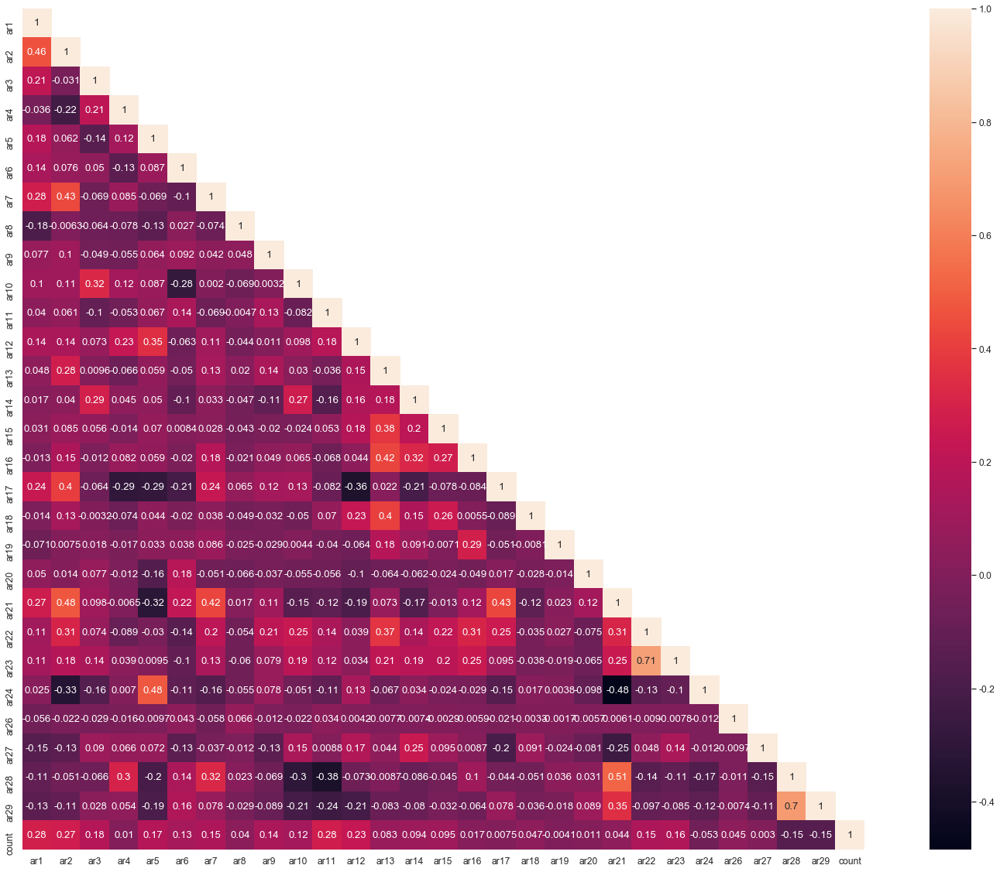

In [224]:
fig, ax = plt.subplots()
fig.set_size_inches(30,20)
sns.heatmap(corrMatt, mask=mask,vmax=1, square=True,annot=True)

- 0.1 이하 제외

In [874]:
corrMatt = relation_train[['year','month', 'day', 'dayofweek', 'season', 'year_month','count']]
corrMatt = corrMatt.corr()
print(corrMatt)
mask = np.array(corrMatt)
mask[np.tril_indices_from(mask)] = False

               year     month       day  dayofweek    season     count
year       1.000000  0.000402 -0.000462  -0.001377 -0.000413  0.228854
month      0.000402  1.000000  0.010522   0.003317  0.206190 -0.146204
day       -0.000462  0.010522  1.000000  -0.004051 -0.012246  0.041825
dayofweek -0.001377  0.003317 -0.004051   1.000000  0.003224  0.107310
season    -0.000413  0.206190 -0.012246   0.003224  1.000000 -0.414769
count      0.228854 -0.146204  0.041825   0.107310 -0.414769  1.000000


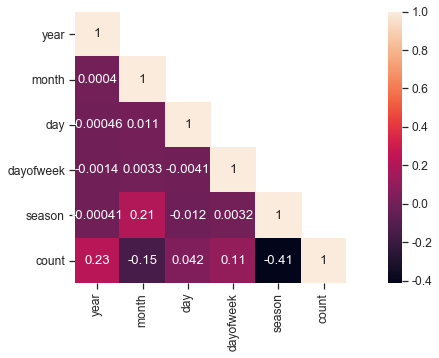

In [875]:
fig, ax = plt.subplots()
fig.set_size_inches(15,5)
sns.heatmap(corrMatt, mask=mask,vmax=1, square=True,annot=True)

- month, season 제외, day, dayofweek

In [230]:
corrMatt = relation_train[['tourday', 'b1', 'b2', 'b3', 'f1', 'f2', 'f3', 'f4', 'x1',
       'x2', 'n1', 'n2', 'p1', 'p3', 'p5', 'p6', 'up1', 'um1', 'uc1', 's1',
       's2', 'o1', 'o2','art1','art2','art3','count']]
corrMatt = corrMatt.corr()
print(corrMatt)
mask = np.array(corrMatt)
mask[np.tril_indices_from(mask)] = False

          tourday        b1        b2        b3        f1        f2        f3  \
tourday  1.000000  0.087689 -0.159887 -0.302369 -0.106467 -0.238353 -0.026479   
b1       0.087689  1.000000 -0.133471  0.523027 -0.089916  0.357687  0.139363   
b2      -0.159887 -0.133471  1.000000 -0.026956  0.055590  0.077079  0.034774   
b3      -0.302369  0.523027 -0.026956  1.000000  0.105632  0.739979  0.143332   
f1      -0.106467 -0.089916  0.055590  0.105632  1.000000  0.688675  0.182331   
f2      -0.238353  0.357687  0.077079  0.739979  0.688675  1.000000  0.243204   
f3      -0.026479  0.139363  0.034774  0.143332  0.182331  0.243204  1.000000   
f4      -0.037766 -0.017527 -0.024700  0.018978  0.144274  0.108012 -0.015841   
x1       0.012743 -0.140630  0.062952 -0.113670 -0.127259 -0.150803 -0.045428   
x2      -0.128255 -0.142105  0.092714  0.072067 -0.072700 -0.009248 -0.024268   
n1       0.068909  0.262301 -0.431921  0.313240 -0.092978  0.121129  0.008921   
n2      -0.272080  0.610595 

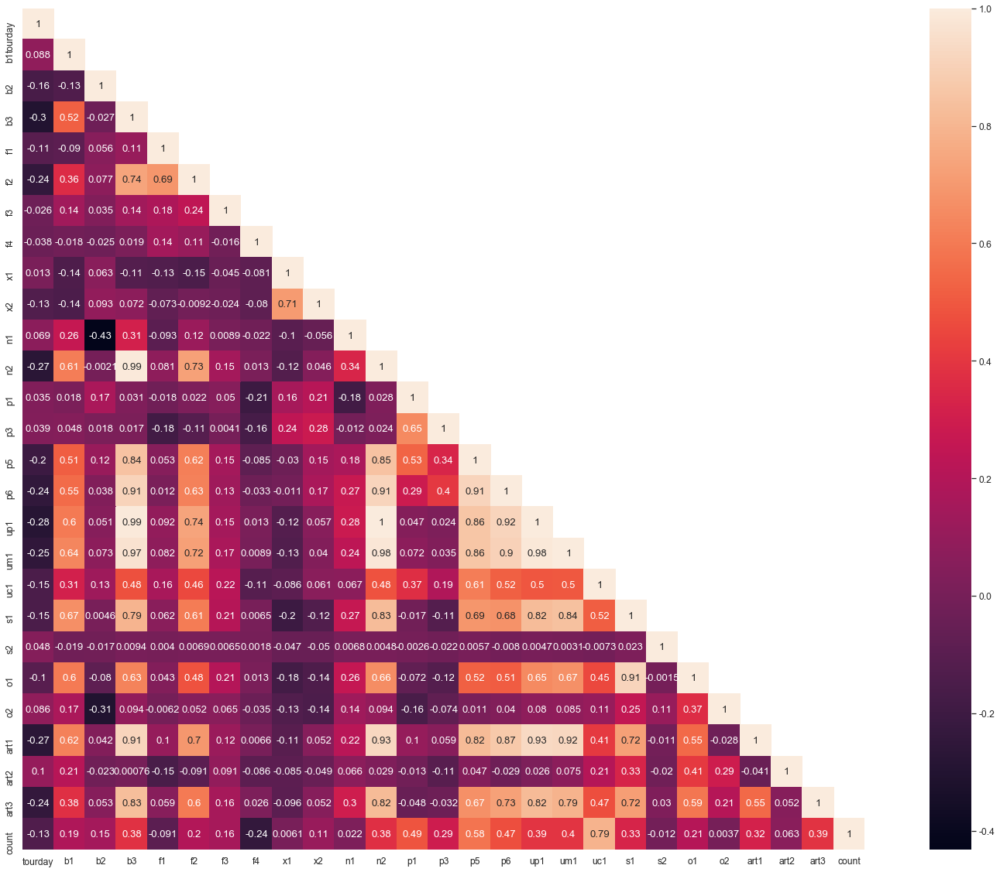

In [231]:
fig, ax = plt.subplots()
fig.set_size_inches(30,20)
sns.heatmap(corrMatt, mask=mask,vmax=1, square=True,annot=True)

- tourday, f4, s2

In [233]:
corrMatt = relation_train[['tourday', 'b1', 'b2', 'b3', 'f1', 'f2', 'f3', 'f4', 'x1',
       'x2', 'n1', 'n2', 'p1', 'p5', 'up1', 'um1', 'uc1', 's1',
       's2', 'o1', 'o2','art1','art2','art3','count']]
corrMatt = corrMatt.corr()
print(corrMatt)
mask = np.array(corrMatt)
mask[np.tril_indices_from(mask)] = False

          tourday        b1        b2        b3        f1        f2        f3  \
tourday  1.000000  0.087689 -0.159887 -0.302369 -0.106467 -0.238353 -0.026479   
b1       0.087689  1.000000 -0.133471  0.523027 -0.089916  0.357687  0.139363   
b2      -0.159887 -0.133471  1.000000 -0.026956  0.055590  0.077079  0.034774   
b3      -0.302369  0.523027 -0.026956  1.000000  0.105632  0.739979  0.143332   
f1      -0.106467 -0.089916  0.055590  0.105632  1.000000  0.688675  0.182331   
f2      -0.238353  0.357687  0.077079  0.739979  0.688675  1.000000  0.243204   
f3      -0.026479  0.139363  0.034774  0.143332  0.182331  0.243204  1.000000   
f4      -0.037766 -0.017527 -0.024700  0.018978  0.144274  0.108012 -0.015841   
x1       0.012743 -0.140630  0.062952 -0.113670 -0.127259 -0.150803 -0.045428   
x2      -0.128255 -0.142105  0.092714  0.072067 -0.072700 -0.009248 -0.024268   
n1       0.068909  0.262301 -0.431921  0.313240 -0.092978  0.121129  0.008921   
n2      -0.272080  0.610595 

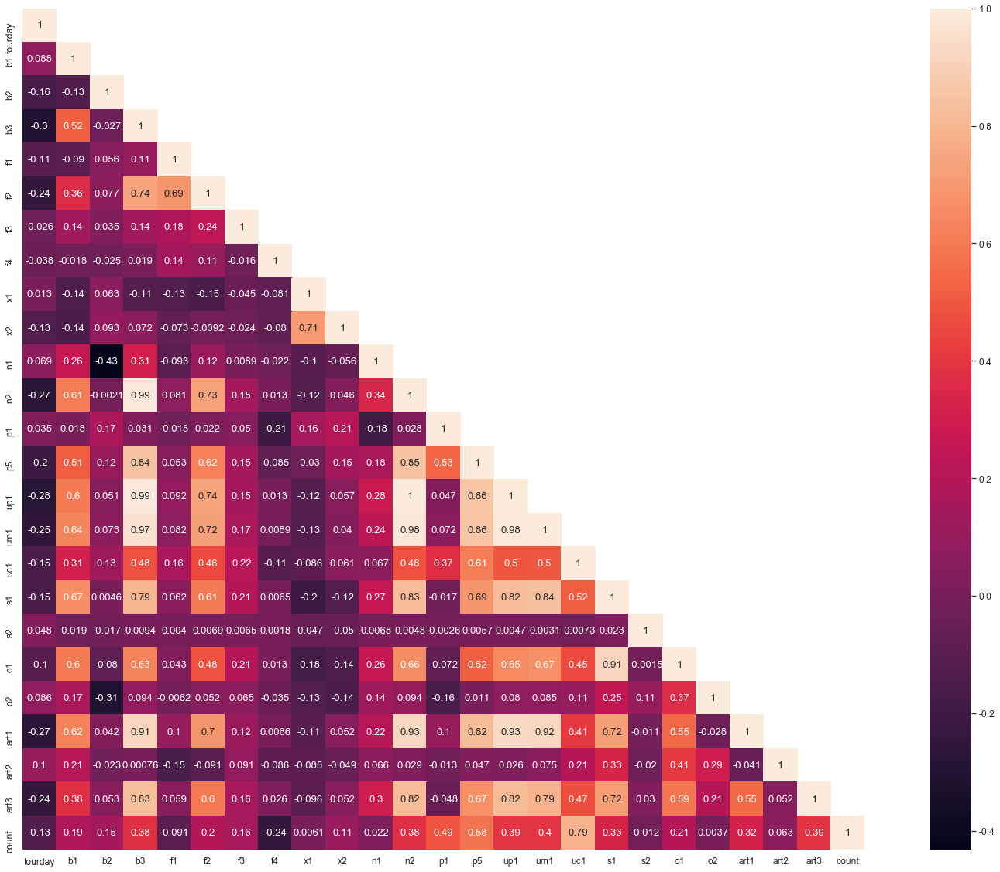

In [234]:
fig, ax = plt.subplots()
fig.set_size_inches(30,20)
sns.heatmap(corrMatt, mask=mask,vmax=1, square=True,annot=True)

- up1과 n2가 상관관계가 1이 나옴... 다중공선성 문제 확인

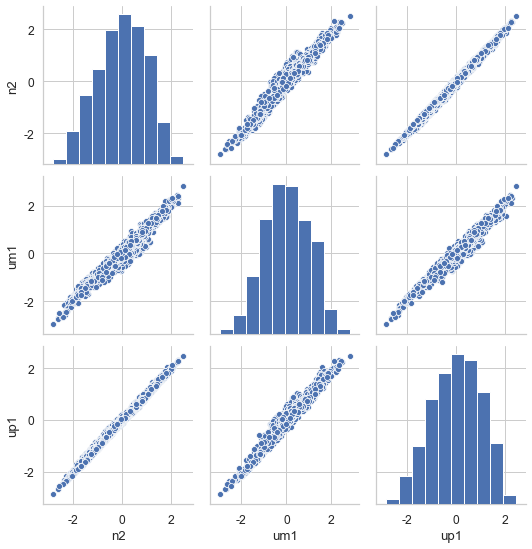

In [237]:
sns.pairplot(X_train[['n2','um1','up1']])

- n2와 up1의 다중공선성 문제 해결을 위해 둘중 하나를 제거하거나 n2를 np.log로 변수를 변환하는 방법중 택1
- 우선 제거하고 난후 제거하지 않았을때 vif지수 확인

In [238]:
from sklearn.model_selection import GridSearchCV, cross_val_score, learning_curve
from sklearn.metrics import mean_absolute_error
from sklearn.linear_model import Lasso
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor

In [239]:
random_state = 2
classifiers = []
classifiers.append(Lasso(random_state=random_state))
classifiers.append(LinearRegression())
classifiers.append(Ridge(random_state=random_state))
classifiers.append(ElasticNet(random_state=random_state))
classifiers.append(SVR())
classifiers.append(RandomForestRegressor(random_state=random_state))
classifiers.append(GradientBoostingRegressor())
classifiers.append(AdaBoostRegressor(random_state = random_state))
classifiers.append(DecisionTreeRegressor())
classifiers.append(XGBRegressor())

In [240]:
X = X_train.drop(['count','datetime'], axis=1)
y = X_train['count']

In [241]:
X = pd.get_dummies(X)

X = np.array(X)
y = np.array(y)

In [242]:
RandomForestRegressor
model = RandomForestRegressor(random_state = random_state)

# Search grid for optimal parameters
ex_param_grid = {
    'n_estimators'      : [10,20,30,40,50],
    'max_features'      : ["auto", "sqrt", "log2"],
    'min_samples_split' : [2,4,8,10,12,14,16]
}

gsRFR = GridSearchCV(model, 
                     param_grid = ex_param_grid, 
                     cv=10, 
                     scoring="neg_mean_squared_error")

gsRFR.fit(X, y)
RFR_best = gsRFR.best_estimator_

# Best score
print('RFR')
print('Best score : ', gsRFR.best_score_)
print('Best params : ', gsRFR.best_params_)

RFR
Best score :  -4270.878646144547
Best params :  {'max_features': 'auto', 'min_samples_split': 14, 'n_estimators': 50}


Text(0.5, 1.0, 'RFR feature importance')

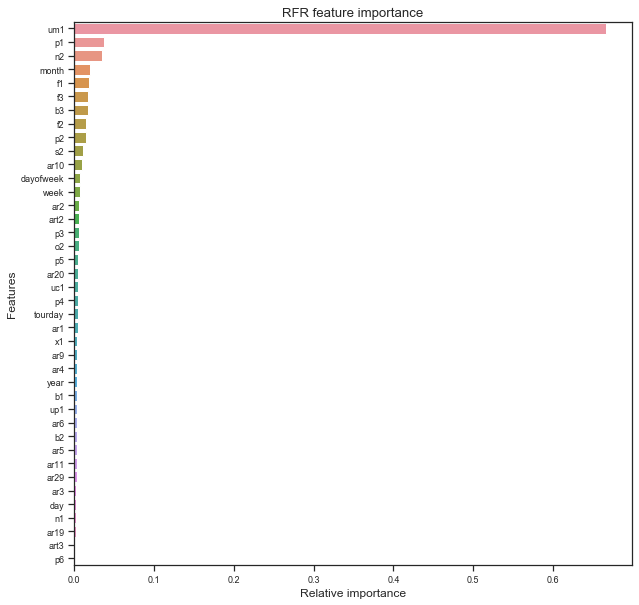

In [852]:
plt.figure(figsize=(10,10))
names_classifiers = [("RFR",RFR_best)]
nclassifier = 0
name = names_classifiers[nclassifier][0]
classifier = names_classifiers[nclassifier][1]
indices = np.argsort(classifier.feature_importances_)[::-1][:50]

train_dummies = pd.get_dummies(X_train.drop(['count'], axis=1))

g = sns.barplot(y=train_dummies.columns[indices][:40],x = classifier.feature_importances_[indices][:40] , orient='h')
g.set_xlabel("Relative importance",fontsize=12)
g.set_ylabel("Features",fontsize=12)
g.tick_params(labelsize=9)
g.set_title(name + " feature importance") 

In [101]:
feature_names = ["f2","f3","x1","x2","n1","p2","p3","uc1","s1","o1","o2","year","month","day","season","dayofweek","um1"]

In [102]:
trainData = X_train[feature_names]
print(trainData.shape)
trainData.head()

(1461, 17)


,f2,f3,x1,x2,n1,p2,p3,uc1,s1,o1,o2,year,month,day,season,dayofweek,um1
0,0.185103,0.636180,-0.330490,-0.851313,-2.162340,0.340266,-0.422543,0.148462,-0.389954,-1.156206,-2.421050,2015,1,1,4,3,-0.058914
1,-0.861253,0.383197,-0.330490,0.407082,-2.162340,0.379969,-0.140794,-0.215470,-1.031019,-1.272067,0.026807,2015,1,2,4,4,-1.115024
2,-0.992048,-0.713061,-0.330490,-0.149913,-2.162340,-0.557960,-1.317174,-0.943334,-0.987557,-1.185171,0.026807,2015,1,3,4,5,-1.115024
3,-0.551477,0.045887,-0.330490,-0.191172,0.158879,-0.402088,-0.798410,0.330428,-1.346119,-1.301032,-2.421050,2015,1,4,4,6,-1.115024
4,-1.563413,-0.207096,2.784642,0.922817,-2.162340,1.071977,0.939368,-1.307266,-1.856798,-1.503789,-2.421050,2015,1,5,4,0,-1.907107


In [103]:
testData = X_test[feature_names]

print(testData.shape)
testData.head()

(365, 17)


,f2,f3,x1,x2,n1,p2,p3,uc1,s1,o1,o2,year,month,day,season,dayofweek,um1
0,0.989744,-1.423688,-0.645081,-0.462806,0.201454,-0.987793,-0.971490,-1.188779,0.650423,0.561896,-1.413037,2019,1,1,4,1,0.679018
1,1.244570,1.908394,-0.645081,0.386172,0.201454,-0.607788,-1.441581,0.528294,0.608445,1.088473,0.347231,2019,1,2,4,2,0.982683
2,0.177484,-1.423688,-0.645081,-1.021344,0.201454,-0.795835,-0.774129,-0.845364,0.608445,0.458462,-1.413037,2019,1,3,4,3,0.729629
3,-0.252536,0.956371,-0.645081,-0.775588,0.201454,-1.248335,-1.913734,-0.330242,-0.524985,-0.340806,-1.413037,2019,1,4,4,4,-0.231978
4,-0.571069,-1.106347,-0.645081,-0.440465,0.201454,-0.673364,-1.282450,-0.845364,-0.664915,-0.557079,-1.413037,2019,1,5,4,5,-0.181367


In [104]:
## 정답컬럼 추출
label_name = "count"

y_train = X_train[label_name]

print(y_train.shape)
y_train.head()

(1461,)


0    321
1    271
2    315
3    271
4    109
Name: count, dtype: int64

In [105]:
from sklearn.ensemble import RandomForestRegressor

max_depth_list = []

model = RandomForestRegressor(n_estimators=100,
                              n_jobs=-1,
                              random_state=0)
model

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=-1, oob_score=False,
                      random_state=0, verbose=0, warm_start=False)

In [106]:
from sklearn.metrics import mean_squared_error, make_scorer, r2_score
from sklearn.pipeline import Pipeline
from scipy.stats import norm, skew, kurtosis
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, KFold
from xgboost import XGBRegressor
from sklearn.metrics import fbeta_score, make_scorer, accuracy_score

In [107]:
# 학습시킴, 피팅(옷을 맞출 때 사용하는 피팅을 생각함) - 피처와 레이블을 넣어주면 알아서 학습을 함
model.fit(trainData, y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=-1, oob_score=False,
                      random_state=0, verbose=0, warm_start=False)

In [108]:
predictions = model.predict(testData)

print(predictions.shape)
predictions[0:10]

(365,)


array([148.43, 265.06, 181.97, 203.32, 192.79, 258.5 , 176.54, 191.22,
       180.23, 193.91])

In [580]:
submission_test = pd.read_csv("sampleSubmission.csv")
submission_test

submission_test["count"] = predictions

print(submission_test.shape)
submission_test.head()

(365, 2)


,datetime,count
0,2019-01-01,148.43
1,2019-01-02,265.06
2,2019-01-03,181.97
3,2019-01-04,203.32
4,2019-01-05,192.79


In [ ]:
submission.to_csv(f"samplesubmission_first.csv", index=False)

In [109]:
sub = pd.read_csv("submission_first.csv", parse_dates=["datetime"])

In [110]:
sub = sub['count']

In [111]:
sub

0      148
1      265
2      182
3      203
4      193
      ... 
360    229
361     87
362    271
363     91
364    152
Name: count, Length: 365, dtype: int64

In [112]:
answer = pd.read_csv("submission_outclear.csv", parse_dates=["datetime"])

In [113]:
answer = answer['dep_count']

In [114]:
answer

0      147
1      284
2      238
3      222
4      231
      ... 
360    412
361    218
362    485
363    285
364    239
Name: dep_count, Length: 365, dtype: int64

In [115]:
## 평균 절대 백분율 오차
## 실제값 대비 오차의 절대값들의 평균
def MAPE(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
MAPE(answer, sub)
## 절대평균오차백분율

25.282078103231953

In [117]:
import numpy as np
## 절대 평균 오차
def MAE(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred)))

MAE(answer, sub)

73.98904109589041

In [118]:
print("1. 개월별 평균 절대 백분율 오차")
print("1개월=",(MAPE(answer[:31], sub[:31])))
print("2개월=",(MAPE(answer[:59], sub[:59])))
print("3개월=",(MAPE(answer[:90], sub[:90])))
print("4개월=",(MAPE(answer[:120], sub[:120])))
print("5개월=",(MAPE(answer[:151], sub[:151])))
print("6개월=",(MAPE(answer[:181], sub[:181])))
print("7개월=",(MAPE(answer[:212], sub[:212])))
print("8개월=",(MAPE(answer[:243], sub[:243])))
print("9개월=",(MAPE(answer[:273], sub[:273])))
print("10개월=",(MAPE(answer[:304], sub[:304])))
print("11개월=",(MAPE(answer[:334], sub[:334])))
print("12개월=",(MAPE(answer[:365], sub[:365])))
print("2. 월별별 평균 절대 백분율 오차")
print("1월=",(MAPE(answer[:31], sub[:31])))
print("2월=",(MAPE(answer[31:59], sub[31:59])))
print("3월=",(MAPE(answer[59:90], sub[59:90])))
print("4월=",(MAPE(answer[90:120], sub[90:120])))
print("5월=",(MAPE(answer[120:151], sub[120:151])))
print("6월=",(MAPE(answer[151:181], sub[151:181])))
print("7월=",(MAPE(answer[181:212], sub[181:212])))
print("8월=",(MAPE(answer[212:243], sub[212:243])))
print("9월=",(MAPE(answer[243:273], sub[243:273])))
print("10월=",(MAPE(answer[273:304], sub[273:304])))
print("11월=",(MAPE(answer[304:334], sub[304:334])))
print("12월=",(MAPE(answer[334:365], sub[334:365])))
print("3. 월별 절대 평균 오차")
print("1월=",(MAE(answer[:31], sub[:31])))
print("2월=",(MAE(answer[31:59], sub[31:59])))
print("3월=",(MAE(answer[59:90], sub[59:90])))
print("4월=",(MAE(answer[90:120], sub[90:120])))
print("5월=",(MAE(answer[120:151], sub[120:151])))
print("6월=",(MAE(answer[151:181], sub[151:181])))
print("7월=",(MAE(answer[181:212], sub[181:212])))
print("8월=",(MAE(answer[212:243], sub[212:243])))
print("9월=",(MAE(answer[243:273], sub[243:273])))
print("10월=",(MAE(answer[273:304], sub[273:304])))
print("11월=",(MAE(answer[304:334], sub[304:334])))
print("12월=",(MAE(answer[334:365], sub[334:365])))

1. 개월별 평균 절대 백분율 오차
1개월= 25.464554427497355
2개월= 24.19675732938225
3개월= 24.074604154393082
4개월= 23.267752192439257
5개월= 22.94792749449609
6개월= 22.040728669426016
7개월= 22.76094022499266
8개월= 22.459580498759646
9개월= 22.616345804402982
10개월= 22.401508506277306
11개월= 23.236506671446893
12개월= 25.282078103231953
2. 월별별 평균 절대 백분율 오차
1월= 25.464554427497355
2월= 22.793124827897667
3월= 23.842119079413713
4월= 20.847196306577807
5월= 21.7098964056838
6월= 17.474494583239963
7월= 26.966046404268855
8월= 20.398668822585456
9월= 23.886144780114066
10월= 20.509554235686622
11월= 31.697821411832056
12월= 47.32146062633538
3. 월별 절대 평균 오차
1월= 81.03225806451613
2월= 62.82142857142857
3월= 81.93548387096774
4월= 75.2
5월= 95.06451612903226
6월= 55.1
7월= 67.54838709677419
8월= 54.58064516129032
9월= 60.13333333333333
10월= 66.25806451612904
11월= 71.8
12월= 114.2258064516129


In [868]:
## test 변수 데이터와 sub예측된 데이터의 rmsle 스코어
k_fold = KFold(n_splits=10, shuffle=True, random_state=0)
%time score = cross_val_score(model, testData,sub, cv=k_fold, scoring=rmsle_scorer)
score = score.mean()
# 0에 근접할수록 좋은 데이터
print("Score= {0:.5f}".format(score))

Wall time: 3.28 s
Score= -19.30886


In [119]:
## 트레인데이터로 적용시켜 만든 모델로 테스트 데이터와 실제 정답을 비교해서 정확도
print(model.score(testData,answer))
## 약 39%

0.38730236721286937


- 첫번쨰 정답 추출 완료